## 이미지 데이터 전처리

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
import shutil

input_dir_heart = "/content/drive/MyDrive/aiffelthon_heartsignal/previous_project/motorcycle/MotorDataset/images_heart"
target_dir_heart = "/content/drive/MyDrive/aiffelthon_heartsignal/previous_project/motorcycle/MotorDataset/annotations_heart"
# etc_dir = "/signal/previous_project/motorcycle/MotorDataset/etc"

# # input_dir에서 .png 파일 리스트 생성
# input_img_files = [f for f in os.listdir(input_dir) if f.endswith(".png")]

# # 파일을 확인하고 적절한 디렉토리로 이동
# for fname in input_img_files:
#     # target_dir로 이동할 조건
#     if fname.endswith("fuse.png"):
#         shutil.move(os.path.join(input_dir, fname), os.path.join(target_dir, fname))
#     # etc_dir로 이동할 조건
#     elif fname.endswith("save.png"):
#         shutil.move(os.path.join(input_dir, fname), os.path.join(etc_dir, fname))
#     # 그 외의 경우, input_dir에 그대로 둠
#     else:
#         continue

In [3]:
import os

# input_dir과 target_dir에서 .png 파일만 필터링하고 정렬
input_img_files = sorted([f for f in os.listdir(input_dir_heart) if f.endswith('.png')])
target_img_files = sorted([f for f in os.listdir(target_dir_heart) if f.endswith('.png')])

# 결과 확인
print("Input Directory의 이미지 파일:", input_img_files)
print("Target Directory의 이미지 파일:", target_img_files)

Input Directory의 이미지 파일: ['14241_AV.png', '68487_AV.png', '84778_TV.png', '84945_AV.png', '84945_MV.png', '84945_PV.png', '84945_TV.png', '84947_MV.png', '84947_PV.png', '84947_TV.png', '84949_AV.png', '84949_MV.png', '84949_TV.png', '84950_AV.png', '84950_TV.png', '84952_AV.png', '84960_MV.png', '84960_PV.png', '84961_TV.png', '84971_MV.png', '84973_PV.png', '84974_MV.png', '84974_PV.png', '84974_TV.png', '84978_AV.png', '84978_MV.png', '84978_PV.png', '84978_TV.png', '84982_AV.png', '84982_MV.png', '84982_PV.png', '84982_TV.png', '84984_MV.png', '84984_PV.png', '84985_AV.png', '84985_MV.png', '84985_PV.png', '84985_TV.png', '84987_AV.png', '84987_MV.png', '84987_PV.png', '84987_TV.png', '84988_AV.png', '84988_MV.png', '84988_PV.png', '84990_AV.png', '84990_MV.png', '84990_PV.png', '84990_TV.png', '84991_AV.png', '84991_MV.png', '84991_PV.png', '84991_TV.png', '84994_AV.png', '84994_MV.png', '84994_PV.png', '84994_TV.png', '84995_AV.png', '84995_MV.png', '84996_AV.png', '84996_MV.png'

In [4]:
# 입력 데이터 개수 확인
len(input_img_files)

100

In [5]:
# 타겟 데이터 개수 확인
len(target_img_files)

100

In [6]:
import os
from PIL import Image

def check_image_sizes(folder_path):
    # 폴더 내의 모든 파일 가져오기
    files = os.listdir(folder_path)

    # 이미지 파일 목록을 저장할 리스트
    image_files = [file for file in files if file.lower().endswith(('.png'))]

    # 첫 번째 이미지의 크기를 기준으로 설정
    first_image = Image.open(os.path.join(folder_path, image_files[0]))
    reference_size = first_image.size

    # 나머지 이미지들의 크기 확인
    for file in image_files[1:]:
        img = Image.open(os.path.join(folder_path, file))
        if img.size != reference_size:
            print("모든 이미지가 동일한 크기가 아닙니다.")
            return

    print("모든 이미지가 동일한 크기입니다:", reference_size)

# 사용 예시
check_image_sizes(input_dir_heart)
check_image_sizes(target_dir_heart)


모든 이미지가 동일한 크기입니다: (256, 256)
모든 이미지가 동일한 크기입니다: (256, 256)


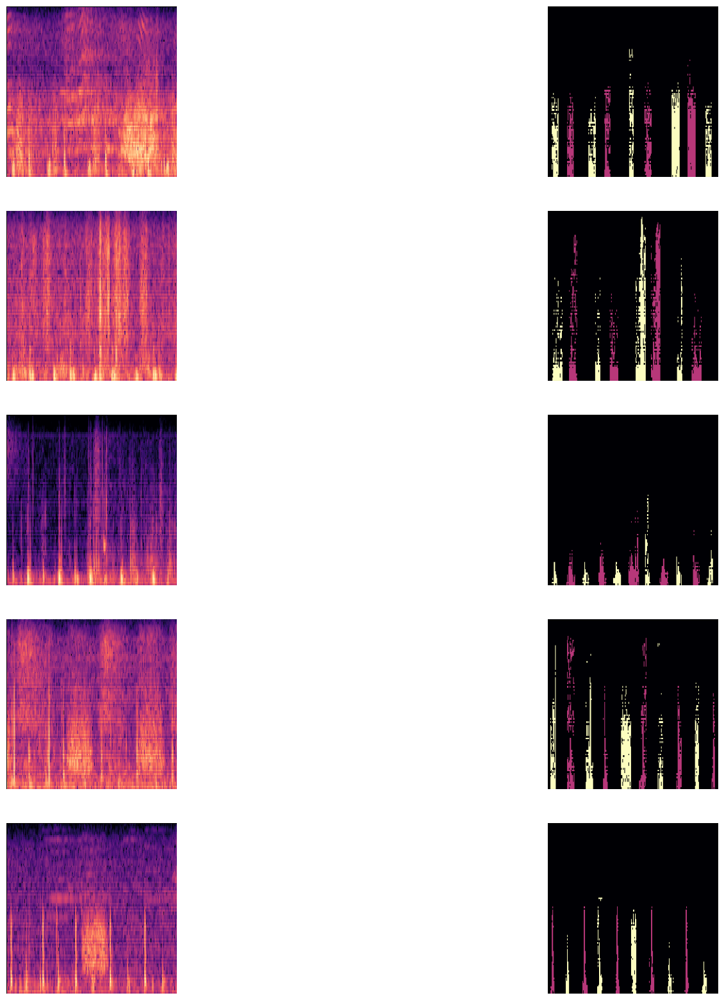

In [7]:
# 데이터 시각화 확인
import matplotlib.pyplot as plt
from tensorflow.keras.utils import load_img, img_to_array

plt.figure(figsize=(20,20))
for j in range(5):
    plt.subplot(5, 2, 2 * j + 1)
    plt.axis("off")
    plt.imshow(load_img(input_dir_heart + '/' + input_img_files[j]))
    plt.subplot(5, 2, 2 * j + 2)
    plt.axis("off")
    plt.imshow(load_img(target_dir_heart + '/' + target_img_files[j]))

In [8]:
# 타겟 데이터의 내부 값 확인
import numpy as np

target = load_img(target_dir_heart + '/' + target_img_files[0],color_mode='grayscale')
target = img_to_array(target)
target = target.astype("uint8")
color = np.unique(target)
color

array([  0,  97, 101, 239, 246], dtype=uint8)

In [9]:
# 타겟 데이터의 내부 값 확인
import numpy as np

target = load_img(target_dir_heart + '/' + target_img_files[3],color_mode='grayscale')
# print(target.size)
target = img_to_array(target)
target = target.astype("uint8")
color = np.unique(target)
color

array([  0,  97, 101, 239, 246], dtype=uint8)

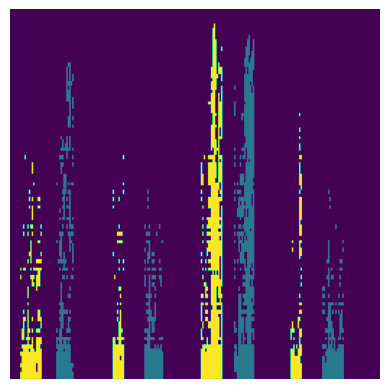

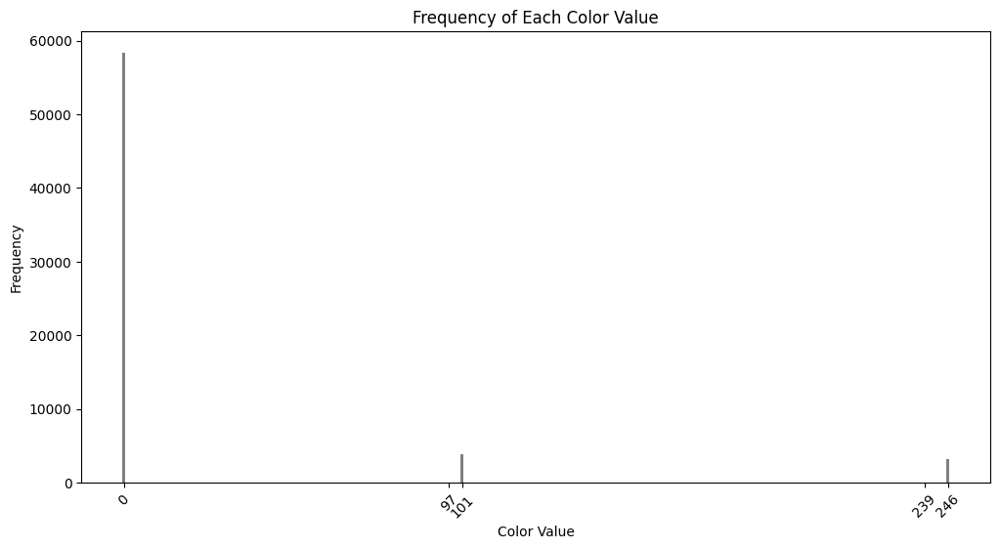

In [10]:
import matplotlib.pyplot as plt
import numpy as np
from keras.preprocessing.image import load_img, img_to_array

# 첫 번째 이미지를 불러옵니다
target = load_img(target_dir_heart + '/' + target_img_files[1], color_mode='grayscale')
target = img_to_array(target)
target = target.astype("uint8")

# 이미지를 시각화합니다
plt.imshow(target)
plt.axis('off')
plt.show()

# 고유한 색상 값 추출
unique_colors = np.unique(target)
# 각 색상 값의 빈도수 계산
color_counts = np.bincount(target.flatten())
# 빈도수가 0이 아닌 색상 값과 해당 빈도수 추출
colors_with_counts = [(color, count) for color, count in enumerate(color_counts) if count > 0]
# 색상 값과 빈도수를 분리
colors, counts = zip(*colors_with_counts)

# 빈도수 시각화
plt.figure(figsize=(12, 6))  # 그래프 크기 조정
plt.bar(colors, counts, color='gray')
plt.title("Frequency of Each Color Value")
plt.xlabel("Color Value")
plt.ylabel("Frequency")
plt.xticks(unique_colors, unique_colors, rotation=45)  # 고유 색상 값의 눈금만 표시
plt.show()

**0: black, 101: blue, 246: red**

In [11]:
import os
from keras.preprocessing.image import load_img, img_to_array, save_img

# 유지할 색상 값 설정
keep_colors = [0, 101, 246]

# 필터링된 이미지를 저장할 디렉토리 확인 및 생성
save_dir = '/content/drive/MyDrive/aiffelthon_heartsignal/previous_project/motorcycle/MotorDataset/filtered_images'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

# 이미지 파일들을 순회하며 처리
for file in target_img_files:
    # 이미지 불러오기
    img_path = os.path.join(target_dir_heart, file)
    img = load_img(img_path, color_mode='grayscale')
    img_array = img_to_array(img)
    img_array = img_array.astype("uint8")

    # 유지할 색상이 아닌 값들을 0으로 설정
    mask = np.isin(img_array, keep_colors)
    filtered_img = np.where(mask, img_array, 0)

    # 채널 차원을 유지하도록 조정
    if filtered_img.ndim == 2:
        filtered_img = np.expand_dims(filtered_img, axis=-1)

    # 필터링된 이미지 저장
    save_path = os.path.join(save_dir, file)
    save_img(save_path, filtered_img)


**타겟 데이터 내부 값 재확인**

In [12]:
target_dir_heart_color = "/content/drive/MyDrive/aiffelthon_heartsignal/previous_project/motorcycle/MotorDataset/filtered_images"
target_img_files = sorted([f for f in os.listdir(target_dir_heart) if f.endswith('.png')])
# print(target_img_files)

# 타겟 데이터의 내부 값 확인
import numpy as np

target = load_img(target_dir_heart_color + '/' + target_img_files[0],color_mode='grayscale')
target = img_to_array(target)
target = target.astype("uint8")
color = np.unique(target)
color

array([  0, 104, 255], dtype=uint8)

In [13]:
label = dict()

for i in range(3):
    label[color[i]] = i

In [14]:
label

{0: 0, 104: 1, 255: 2}

In [15]:
import numpy as np
import random

img_size = (256, 256)
num_imgs = len(input_img_files)

random.Random(1337).shuffle(input_img_files)
random.Random(1337).shuffle(target_img_files)

def path_to_input_image(path):
    return img_to_array(load_img(path, target_size=img_size))

def path_to_target(path):
    img = img_to_array(
        load_img(path, target_size=img_size, color_mode="grayscale"))
    img = img.astype("uint8")
    for c in color:
        img = np.where(img==c, label[c], img)
    return img

input_imgs = np.zeros((num_imgs,) + img_size + (3,), dtype="float32")
targets = np.zeros((num_imgs,) + img_size + (1,), dtype="uint8")

for i in range(num_imgs):
    input_imgs[i] = path_to_input_image(input_dir_heart + '/' + input_img_files[i])
    targets[i] = path_to_target(target_dir_heart_color + '/' + target_img_files[i])

In [16]:
targets[0].shape

(256, 256, 1)

In [17]:
input_imgs[0].shape

(256, 256, 3)

In [18]:
print(input_dir_heart + '/' + input_img_files[i])
print(target_dir_heart_color + '/' + target_img_files[i])

/content/drive/MyDrive/aiffelthon_heartsignal/previous_project/motorcycle/MotorDataset/images_heart/85036_PV.png
/content/drive/MyDrive/aiffelthon_heartsignal/previous_project/motorcycle/MotorDataset/filtered_images/85036_PV_seg_label.png


In [19]:
input_imgs[0]

array([[[  0.,   0.,   0.],
        [  0.,   0.,   0.],
        [  0.,   0.,   0.],
        ...,
        [  0.,   0.,   0.],
        [  0.,   0.,   0.],
        [  0.,   0.,   0.]],

       [[  0.,   0.,   0.],
        [ 60.,  13., 108.],
        [104.,  28., 125.],
        ...,
        [ 57.,  14., 108.],
        [ 57.,  14., 108.],
        [ 93.,  23., 124.]],

       [[  0.,   0.,   0.],
        [ 40.,  16.,  89.],
        [104.,  28., 129.],
        ...,
        [ 74.,  16., 121.],
        [ 95.,  24., 127.],
        [104.,  28., 129.]],

       ...,

       [[  0.,   0.,   0.],
        [216.,  71., 101.],
        [231.,  82.,  99.],
        ...,
        [250., 129.,  95.],
        [235.,  87.,  96.],
        [222.,  73., 104.]],

       [[  0.,   0.,   0.],
        [216.,  71., 101.],
        [231.,  82.,  99.],
        ...,
        [250., 129.,  95.],
        [235.,  87.,  96.],
        [222.,  73., 104.]],

       [[  0.,   0.,   0.],
        [210.,  69.,  98.],
        [224.,  

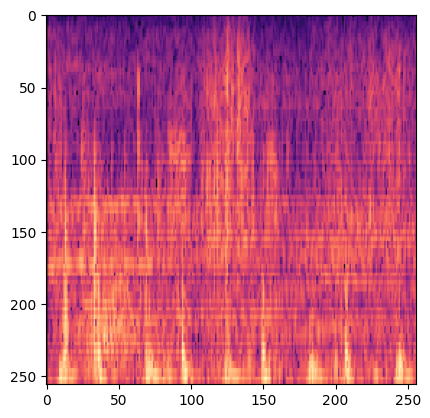

In [20]:
plt.imshow(input_imgs[0]/255)

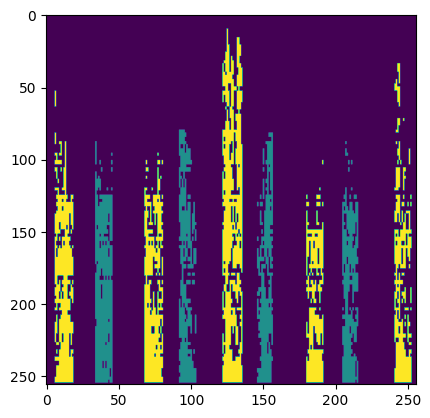

In [21]:
plt.imshow(targets[0]/255)

In [22]:
num_test_samples = int(0.1 * num_imgs)
num_val_samples = int(0.1 * num_imgs)
train_input_imgs = input_imgs[:-(num_test_samples + num_val_samples)]
train_targets = targets[:-(num_test_samples + num_val_samples)]
val_input_imgs = input_imgs[-(num_test_samples + num_val_samples):-num_test_samples]
val_targets = targets[-(num_test_samples + num_val_samples):-num_test_samples]
test_input_imgs = input_imgs[-num_test_samples:]
test_targets = targets[-num_test_samples:]

In [23]:
len(train_input_imgs)

80

In [24]:
len(val_input_imgs)

10

## 데이터 증강

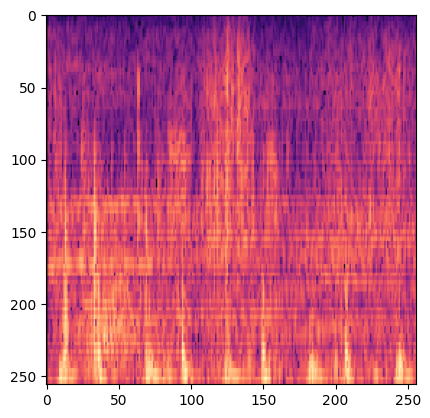

In [25]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import img_to_array, load_img
import matplotlib.pyplot as plt

# 데이터 증강을 수행하는 함수 (좌우 반전 포함)
def augment(image, label):
    # 랜덤 좌우 반전
    concat_img_label = tf.concat([image, label], axis=-1)
    concat_img_label_flipped = tf.image.random_flip_left_right(concat_img_label)

    # 좌우 반전 후 다시 이미지와 라벨로 분리
    image_flipped, label_flipped = tf.split(concat_img_label_flipped, [3, 1], axis=-1)

    return image_flipped, label_flipped

# 데이터셋의 각 이미지에 증강을 적용
for i in range(80):
    train_input_imgs[i], train_targets[i] = augment(train_input_imgs[i], train_targets[i])

# 이미지 표시
plt.imshow(train_input_imgs[0]/255)  # 이미지를 0에서 1 사이의 값으로 스케일링
plt.show()

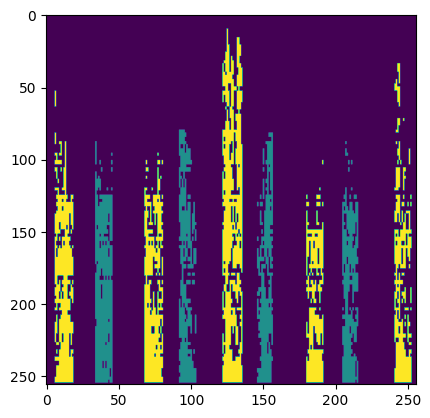

In [26]:
plt.imshow(train_targets[0]/255)

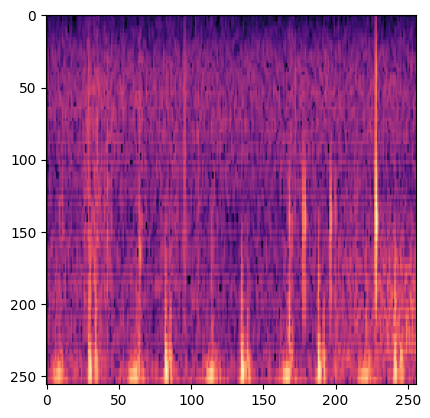

In [27]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import img_to_array, load_img
import matplotlib.pyplot as plt

# 데이터 증강을 수행하는 함수 (좌우 반전 포함)
def augment(image, label):
    # 랜덤 좌우 반전
    concat_img_label = tf.concat([image, label], axis=-1)
    concat_img_label_flipped = tf.image.random_flip_left_right(concat_img_label)

    # 좌우 반전 후 다시 이미지와 라벨로 분리
    image_flipped, label_flipped = tf.split(concat_img_label_flipped, [3, 1], axis=-1)

    return image_flipped, label_flipped

# 데이터셋의 각 이미지에 증강을 적용
for i in range(10):
    val_input_imgs[i], val_targets[i] = augment(val_input_imgs[i], val_targets[i])

# 이미지 표시
plt.imshow(val_input_imgs[0]/255)  # 이미지를 0에서 1 사이의 값으로 스케일링
plt.show()

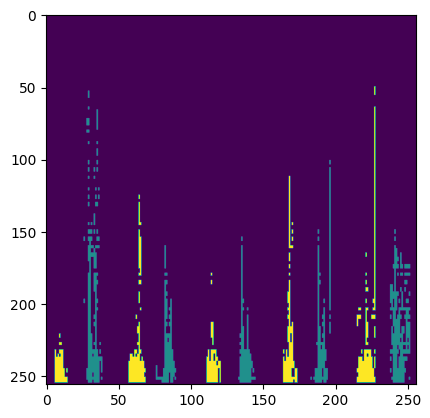

In [28]:
plt.imshow(val_targets[0]/255)

## 모델 정의 및 학습

***
**U-Net**
![image-2.png](attachment:image-2.png)

In [29]:
from tensorflow.keras.layers import Input, Conv2D, Dropout, MaxPooling2D, Conv2DTranspose, concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.layers.experimental.preprocessing import Rescaling

def build_model(img_size, num_classes):
    inputs = Input(shape=img_size + (3,))
    rescaling = Rescaling(1./255)(inputs)
    #Contracting Path
    conv1 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal')(rescaling)
    conv1 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same',kernel_initializer='he_normal')(pool1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same',kernel_initializer='he_normal')(pool2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
    conv4 = Conv2D(512, 3, activation='relu', padding='same',kernel_initializer='he_normal')(pool3)
    conv4 = Conv2D(512, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    conv5 = Conv2D(1024, 3, activation='relu', padding='same',kernel_initializer='he_normal')(pool4)
    conv5 = Conv2D(1024, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv5)

    #Expanding Path
    up6 = Conv2DTranspose(512, 2, activation='relu', strides=(2,2), kernel_initializer='he_normal')(conv5)
    merge6 = concatenate([conv4,up6], axis = 3)
    conv6 = Conv2D(512, 3, activation='relu', padding='same',kernel_initializer='he_normal')(merge6)
    conv6 = Conv2D(512, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv6)
    up7 = Conv2DTranspose(256, 2, activation='relu', strides=(2,2), kernel_initializer='he_normal')(conv6)
    merge7 = concatenate([conv3,up7], axis = 3)
    conv7 = Conv2D(256, 3, activation='relu', padding='same',kernel_initializer='he_normal')(merge7)
    conv7 = Conv2D(256, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv7)
    up8 = Conv2DTranspose(128, 2, activation='relu', strides=(2,2), kernel_initializer='he_normal')(conv7)
    merge8 = concatenate([conv2,up8], axis = 3)
    conv8 = Conv2D(128, 3, activation='relu', padding='same',kernel_initializer='he_normal')(merge8)
    conv8 = Conv2D(128, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv8)
    up9 = Conv2DTranspose(64, 2, activation='relu', strides=(2,2), kernel_initializer='he_normal')(conv8)
    merge9 = concatenate([conv1,up9], axis = 3)
    conv9 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal')(merge9)
    conv9 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv9)
    conv10 = Conv2D(num_classes, 3, activation='softmax', padding='same',kernel_initializer='he_normal')(conv9)

    model = Model(inputs = inputs, outputs = conv10)
    return model

In [30]:
model = build_model(img_size=img_size, num_classes=3)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 rescaling (Rescaling)       (None, 256, 256, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv2d (Conv2D)             (None, 256, 256, 64)         1792      ['rescaling[0][0]']           
                                                                                                  
 conv2d_1 (Conv2D)           (None, 256, 256, 64)         36928     ['conv2d[0][0]']              
                                                                                              

In [31]:
from tensorflow.keras.callbacks import ModelCheckpoint

model.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"])

callbacks = ModelCheckpoint("seg_model_unet.keras", save_best_only=True)

history = model.fit(train_input_imgs, train_targets,
                    epochs=100,
                    callbacks=callbacks,
                    batch_size=16,
                    validation_data=(val_input_imgs, val_targets))

Epoch 1/100
5/5 [==============================] - 62s 4s/step - loss: 1.0218 - accuracy: 0.7382 - val_loss: 0.4541 - val_accuracy: 0.9270
Epoch 2/100
5/5 [==============================] - 6s 1s/step - loss: 0.4825 - accuracy: 0.9157 - val_loss: 0.3914 - val_accuracy: 0.9270
Epoch 3/100
5/5 [==============================] - 6s 1s/step - loss: 0.3973 - accuracy: 0.9157 - val_loss: 0.2909 - val_accuracy: 0.9270
Epoch 4/100
5/5 [==============================] - 6s 1s/step - loss: 0.3197 - accuracy: 0.9152 - val_loss: 0.2760 - val_accuracy: 0.9270
Epoch 5/100
5/5 [==============================] - 6s 1s/step - loss: 0.2837 - accuracy: 0.9152 - val_loss: 0.2308 - val_accuracy: 0.9270
Epoch 6/100
5/5 [==============================] - 6s 1s/step - loss: 0.2658 - accuracy: 0.9137 - val_loss: 0.2194 - val_accuracy: 0.9270
Epoch 7/100
5/5 [==============================] - 6s 1s/step - loss: 0.2563 - accuracy: 0.9157 - val_loss: 0.2131 - val_accuracy: 0.9270
Epoch 8/100
5/5 [================

## 학습 결과 평가 - Unet

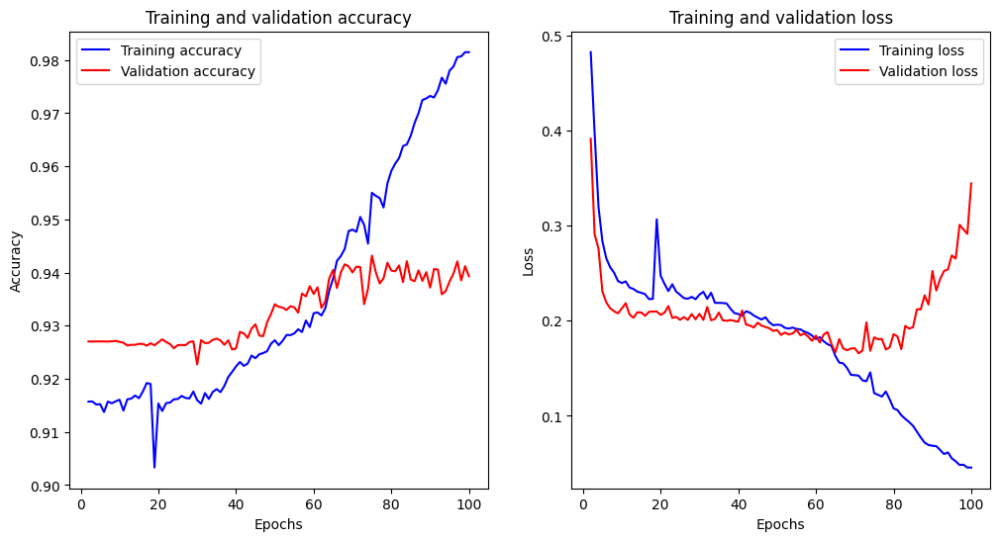

In [32]:
# 손실 그래프
epochs = range(2, len(history.history["loss"]) + 1)
loss = history.history["loss"][1:] # 1의 손실 함수가 너무 커서 제외
val_loss = history.history["val_loss"][1:]

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.plot(epochs, loss, "b", label="Training loss")
plt.plot(epochs, val_loss, label="Validation loss", color = 'red')
plt.title("Training and validation loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

# 정확도 그래프
acc = history.history["accuracy"][1:]
val_acc = history.history["val_accuracy"][1:]

plt.subplot(1, 2, 1)
plt.plot(epochs, acc, "b", label="Training accuracy")
plt.plot(epochs, val_acc, label="Validation accuracy", color = 'red')
plt.title("Training and validation accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()

plt.show()

In [33]:
from tensorflow.keras.models import load_model

test_loss, test_accuracy = model.evaluate(test_input_imgs, test_targets)

# 평가 결과 출력
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

1/1 [==============================] - 0s 255ms/step - loss: 0.5835 - accuracy: 0.9072
Test Loss: 0.583547830581665
Test Accuracy: 0.9072326421737671


In [34]:
prediction = model.predict(test_input_imgs)

1/1 [==============================] - 0s 370ms/step


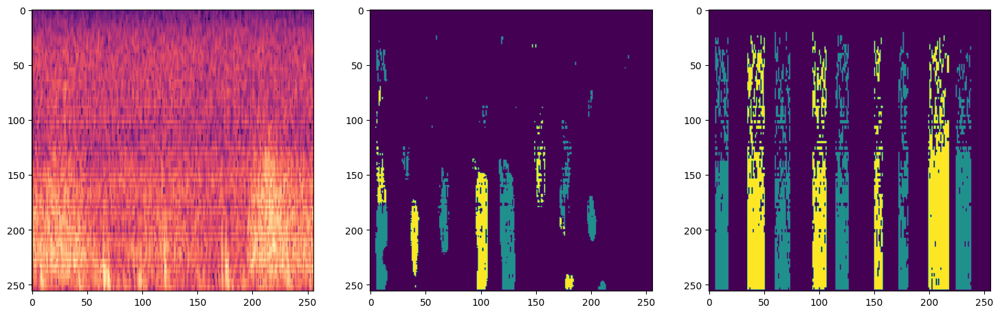

In [35]:
plt.figure(figsize=(18, 6))
plt.subplot(1,3,1)
plt.imshow(test_input_imgs[0]/255)

plt.subplot(1,3,2)
output = np.argmax(prediction[0], axis=-1)
plt.imshow(output)

plt.subplot(1,3,3)
plt.imshow(test_targets[0])

In [36]:
def calculate_iou(y_true, y_pred):
    intersection = np.logical_and(y_true, y_pred)
    union = np.logical_or(y_true, y_pred)
    iou = np.sum(intersection) / np.sum(union)
    return iou

IoU for sample 1: 0.05996110306381945


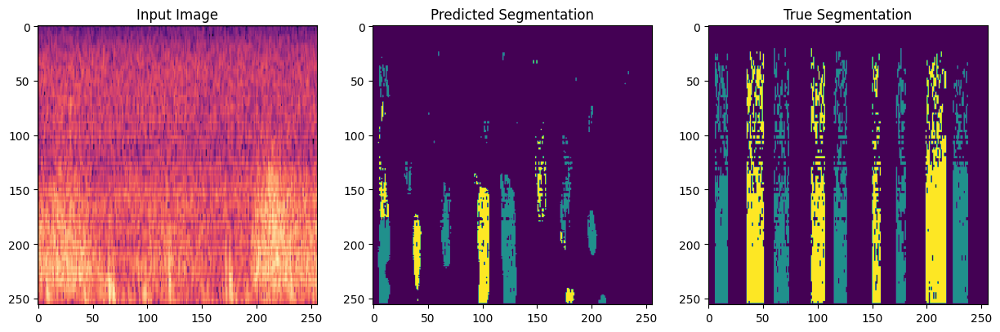

IoU for sample 2: 0.01091192333565435


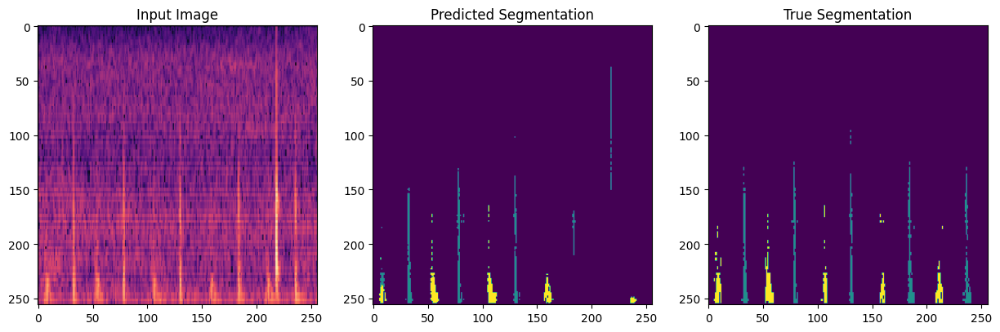

IoU for sample 3: 0.037551541901388


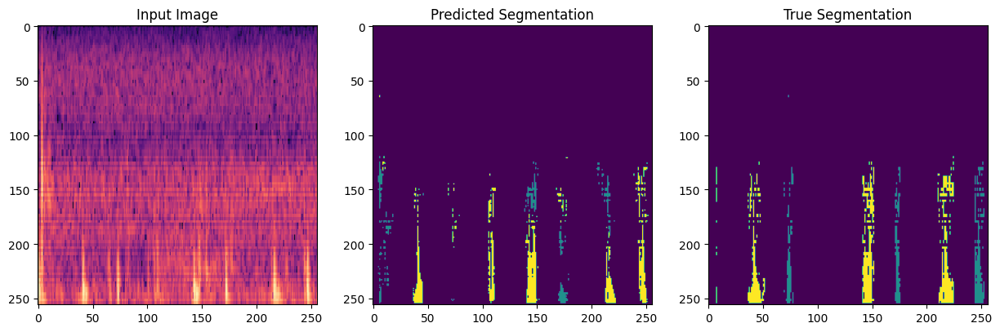

IoU for sample 4: 0.0624475531478125


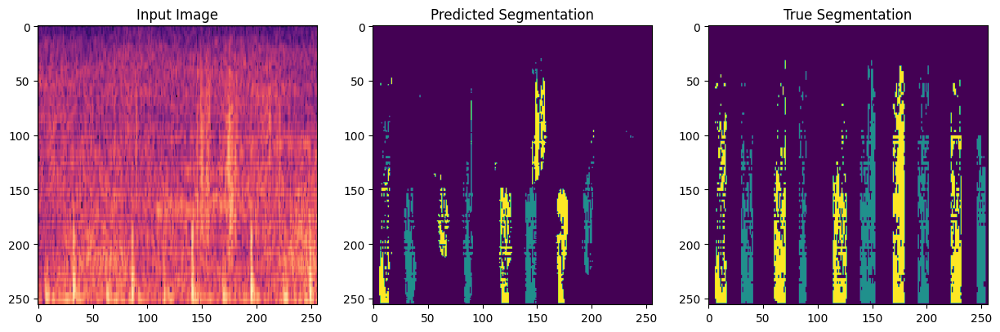

IoU for sample 5: 0.008425765122529691


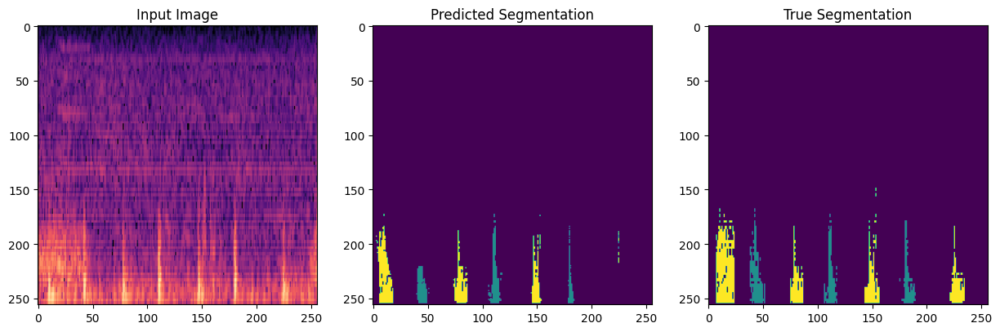

IoU for sample 6: 0.01078019454281492


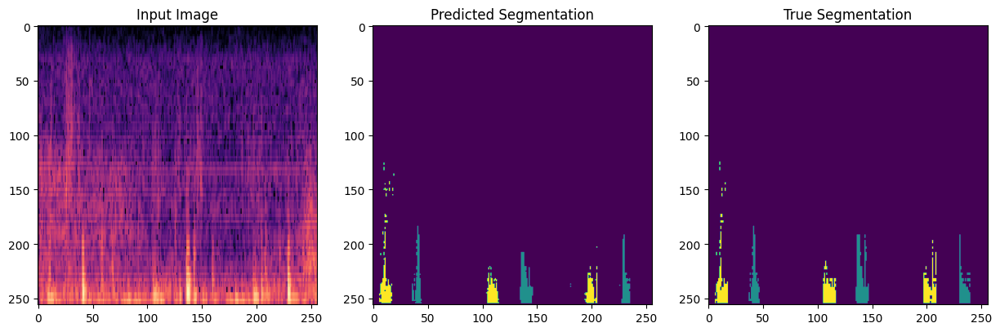

IoU for sample 7: 0.03548974546924175


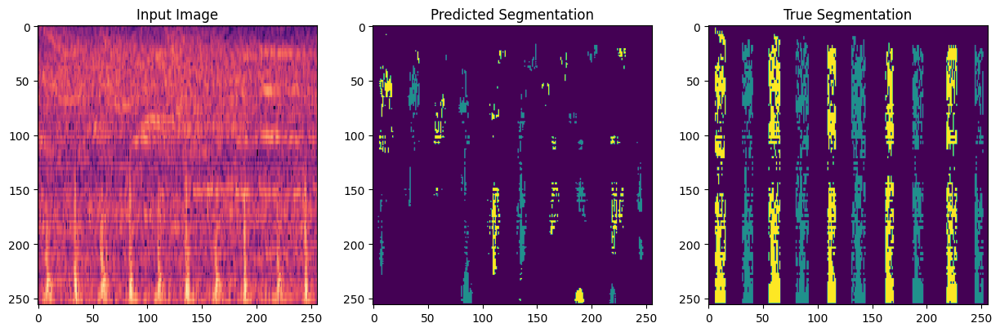

IoU for sample 8: 0.050614344624209696


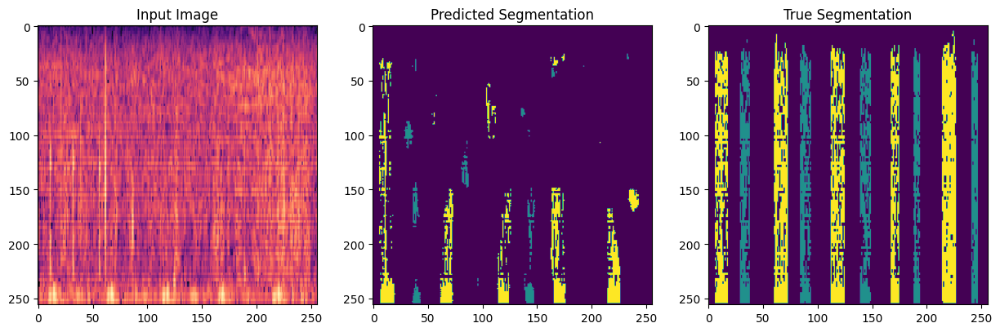

IoU for sample 9: 0.01374300517875897


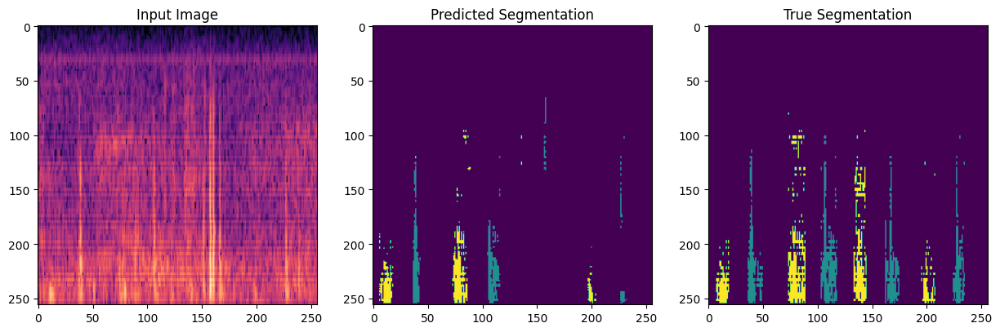

IoU for sample 10: 0.021663041245381456


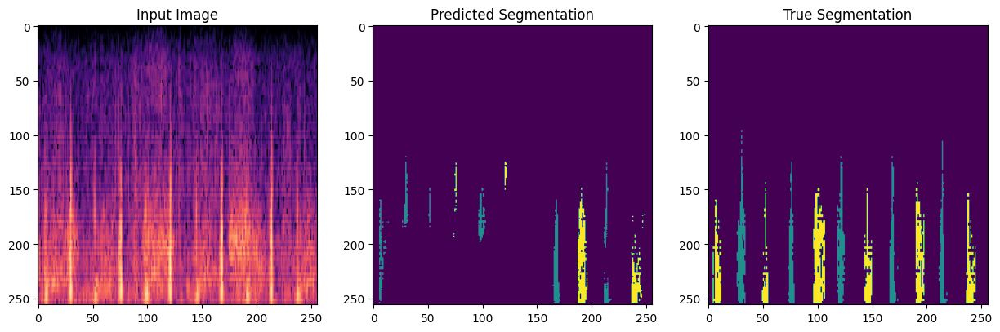

In [37]:
# IoU 계산 및 출력
iou_values = []

for i in range(len(test_input_imgs)):
    # 시각화를 위한 subplot 설정
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(test_input_imgs[i] / 255)
    plt.title("Input Image")

    plt.subplot(1, 3, 2)
    output = np.argmax(prediction[i], axis=-1)
    plt.imshow(output)
    plt.title("Predicted Segmentation")

    plt.subplot(1, 3, 3)
    plt.imshow(test_targets[i])
    plt.title("True Segmentation")

    # IoU 계산 및 출력
    iou = calculate_iou(test_targets[i], output)
    iou_values.append(iou)
    print(f"IoU for sample {i + 1}: {iou}")

    # 시각화를 위한 subplot 초기화
    plt.show()

In [38]:
# 전체 평균 IoU 출력
average_iou = np.mean(iou_values)
print(f"\nAverage IoU across all samples: {average_iou}")


Average IoU across all samples: 0.031158821763161076


**클래스 별로 IoU 구하는 새로운 IoU 만들어 보자!**

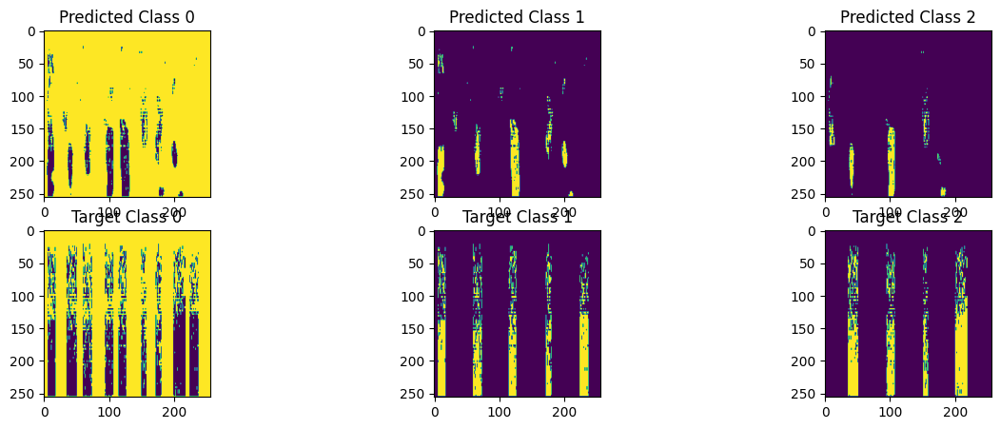

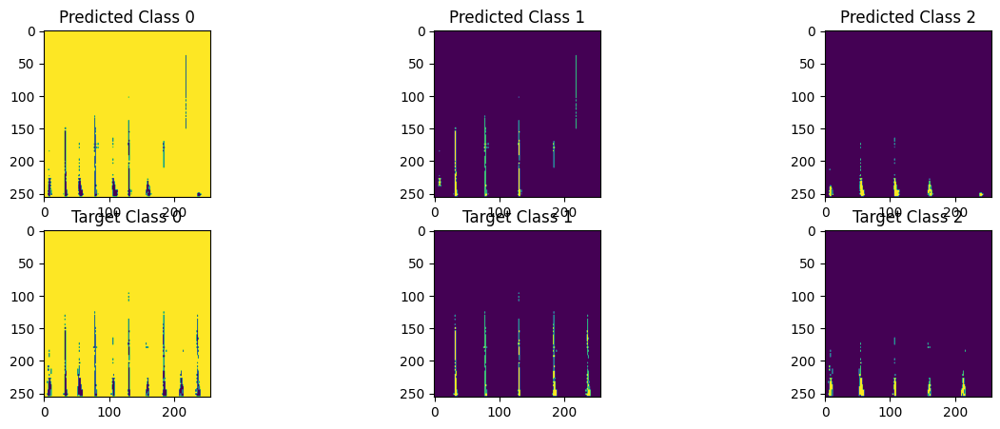

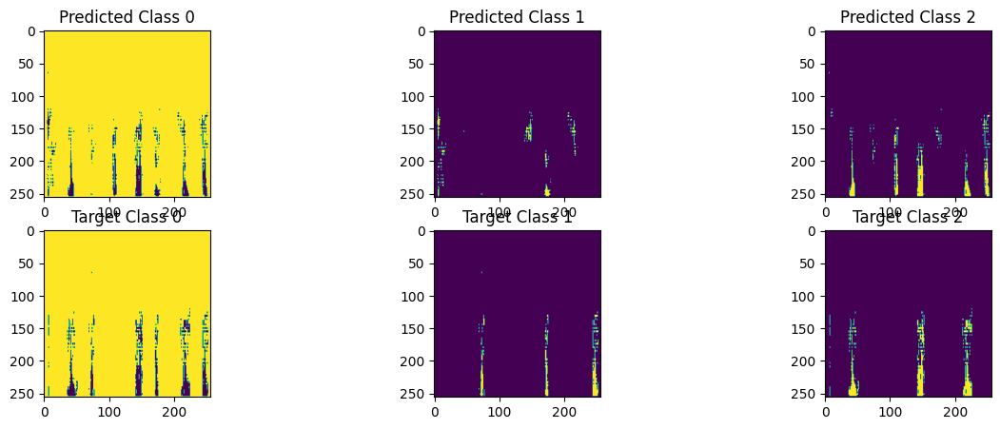

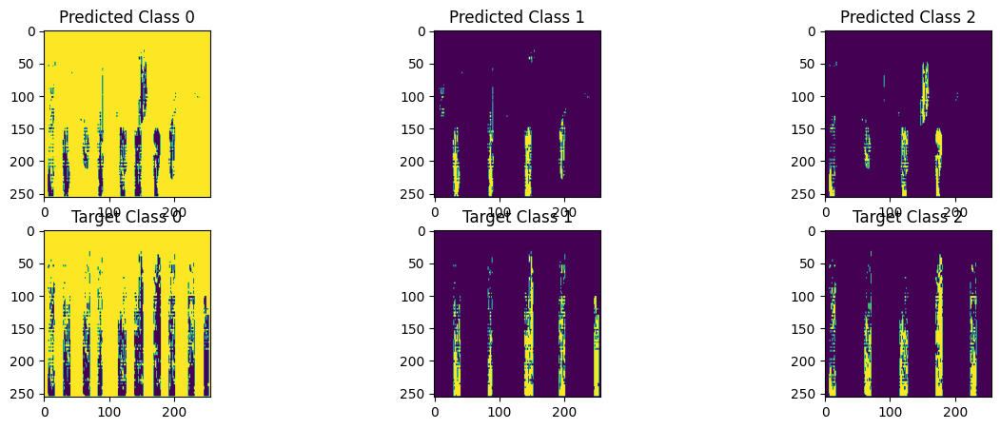

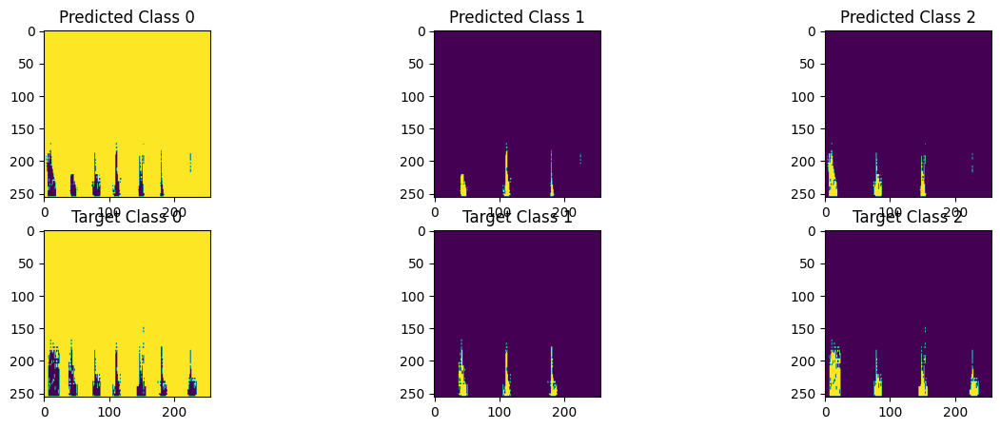

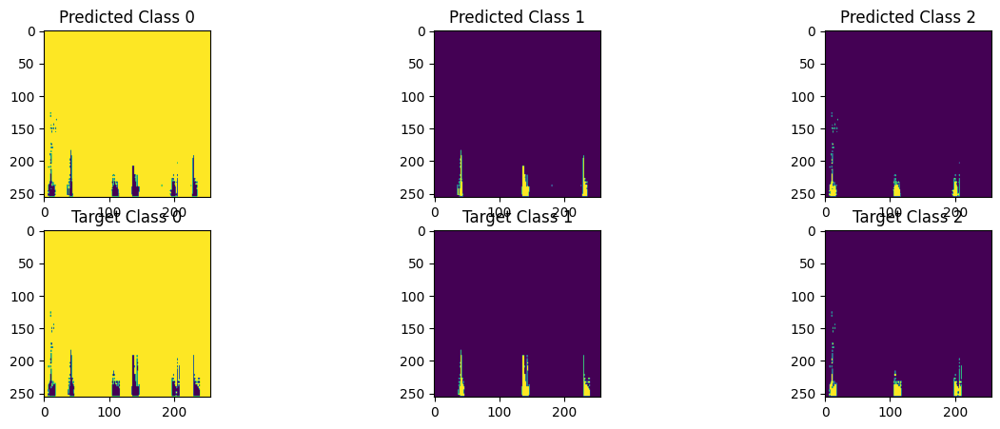

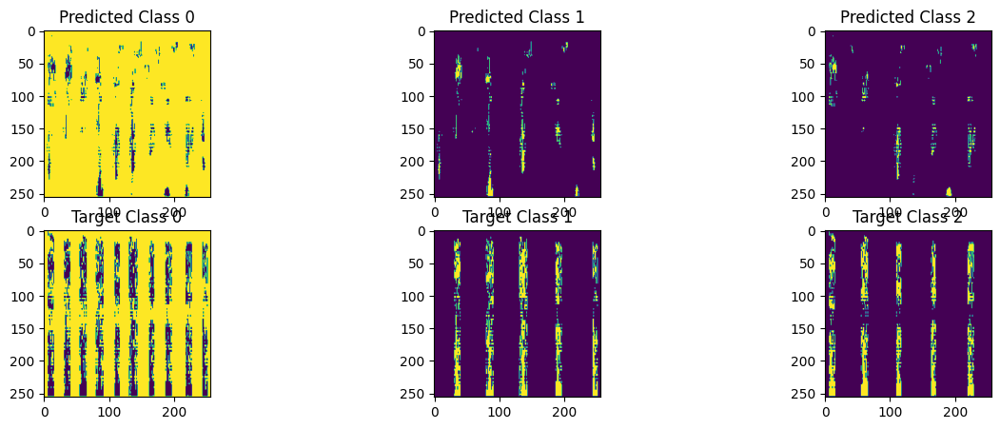

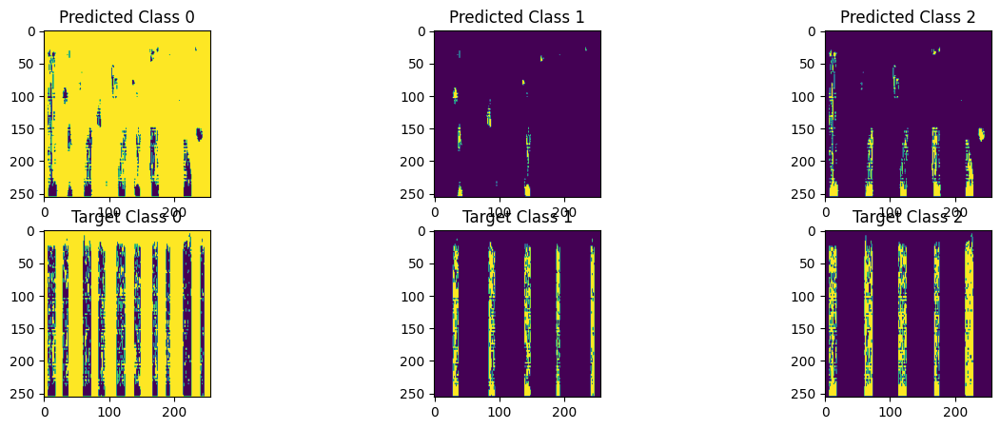

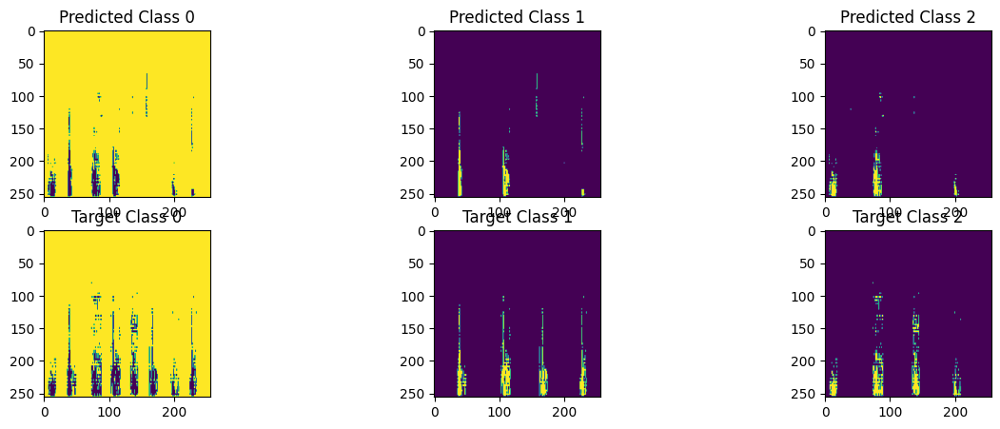

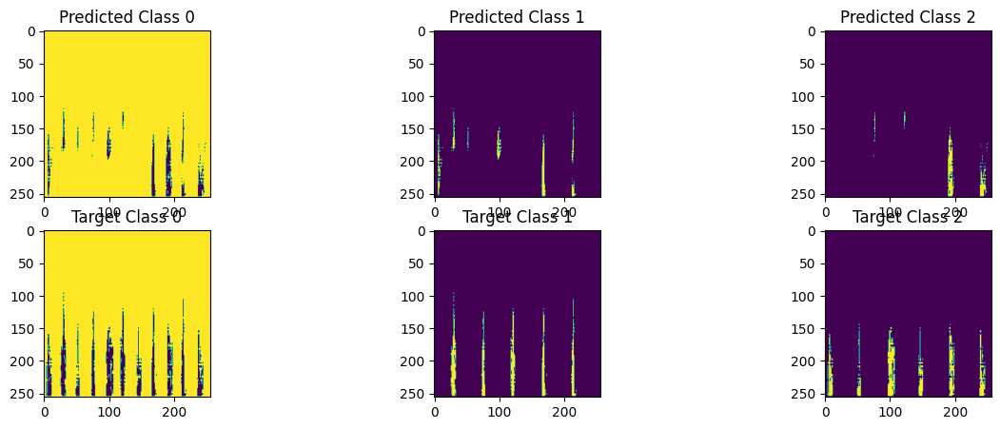

In [39]:
from tensorflow.keras.models import load_model
import numpy as np
import matplotlib.pyplot as plt

# IoU 계산 함수
def calculate_iou(y_true, y_pred, class_index):
    intersection = np.logical_and(y_true == class_index, y_pred == class_index)
    union = np.logical_or(y_true == class_index, y_pred == class_index)
    iou = np.sum(intersection) / np.sum(union)
    return iou

for i in range(len(test_input_imgs)):
    # 시각화를 위한 subplot 설정
    plt.figure(figsize=(15, 5))

    # plt.subplot(1, 4, 1)
    # plt.imshow(test_input_imgs[i] / 255)
    # plt.title("Input Image")

    for class_index in range(3):  # 클래스 수에 따라 반복
        plt.subplot(2, 3, class_index + 1)
        output = np.argmax(prediction[i], axis=-1)
        plt.imshow(output == class_index)
        plt.title(f"Predicted Class {class_index}")

        plt.subplot(2, 3, class_index + 4)
        plt.imshow(test_targets[i]==class_index)
        plt.title(f"Target Class {class_index}")

    # 시각화를 위한 subplot 초기화
    plt.show()

In [40]:
def calculate_iou_score(target, prediction):
# 각 픽셀별로 어떤 클래스로 예측하고 있는지를 알아야 함
# (128, 128, 6) -> (128, 128, 1)
    one_c_prediction = np.argmax(prediction, axis=2)
    one_c_target = target[:, :, 0]

    # 이미지의 전체 영역 크기 계산
    total_area = one_c_prediction.shape[0] ** 2

    # 각 클래스에 대한 IoU 및 영역 정보를 저장할 리스트 초기화
    IoUs = []
    areas = []

    for class_i in range(3):
        # 해당 클래스에 속하는 픽셀을 True로 설정
        pred = np.where(one_c_prediction==class_i, True, False)
        target = np.where(one_c_target==class_i, True, False)

        intersection = np.logical_and(target, pred) # 교집합
        union = np.logical_or(target, pred) # 합집합
        iou_score = np.sum(intersection) / np.sum(union)

        IoUs.append(iou_score) # IoU 결과 리스트 추가

        # 해당 클래스가 차지하는 영역 구하기
        area = pred.sum() / total_area
        areas.append(area)

    return IoUs, areas

In [41]:
IoUs, areas = calculate_iou_score(targets[0], prediction[0])

In [42]:
sum(IoUs) / 3

0.2807112690272574

In [43]:
sum([iou * area for iou, area in zip(IoUs, areas)]) # 영역의 크기로 가중치

0.7464352041224485

***
**U-net++**
![image-2.png](attachment:image-2.png)

In [44]:
from keras.layers import UpSampling2D

def build_model2(img_size, num_classes):
    inputs = Input(shape=img_size + (3,))
    rescaling = Rescaling(1./255)(inputs)
    # X0,0
    conv0_0 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal')(inputs)
    conv0_0 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv0_0)
    pool0_0 = MaxPooling2D(pool_size=(2, 2))(conv0_0)
    # X1,0
    conv1_0 = Conv2D(128, 3, activation='relu', padding='same',kernel_initializer='he_normal')(pool0_0)
    conv1_0 = Conv2D(128, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv1_0)
    pool1_0 = MaxPooling2D(pool_size=(2, 2))(conv1_0)
    # X2,0
    conv2_0 = Conv2D(256, 3, activation='relu', padding='same',kernel_initializer='he_normal')(pool1_0)
    conv2_0 = Conv2D(256, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv2_0)
    pool2_0 = MaxPooling2D(pool_size=(2, 2))(conv2_0)
    # X3,0
    conv3_0 = Conv2D(512, 3, activation='relu', padding='same',kernel_initializer='he_normal')(pool2_0)
    conv3_0 = Conv2D(512, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv3_0)
    pool3_0 = MaxPooling2D(pool_size=(2, 2))(conv3_0)
    # X4,0
    conv4_0 = Conv2D(1024, 3, activation='relu', padding='same',kernel_initializer='he_normal')(pool3_0)
    conv4_0 = Conv2D(1024, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv4_0)

    # X0,1
    up1_0 = Conv2D(64, 2, activation='relu', padding='same',kernel_initializer='he_normal')(UpSampling2D(size = (2,2))(conv1_0))
    merge0_1 = concatenate([up1_0, conv0_0], axis = 3)
    conv0_1 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal')(merge0_1)
    conv0_1 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv0_1)
    # X1,1
    up2_0 = Conv2D(128, 2, activation='relu', padding='same',kernel_initializer='he_normal')(UpSampling2D(size = (2,2))(conv2_0))
    merge1_1 = concatenate([up2_0, conv1_0], axis = 3)
    conv1_1 = Conv2D(128, 3, activation='relu', padding='same',kernel_initializer='he_normal')(merge1_1)
    conv1_1 = Conv2D(128, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv1_1)
    # X2,1
    up3_0 = Conv2D(256, 2, activation='relu', padding='same',kernel_initializer='he_normal')(UpSampling2D(size = (2,2))(conv3_0))
    merge2_1 = concatenate([up3_0, conv2_0], axis = 3)
    conv2_1 = Conv2D(256, 3, activation='relu', padding='same',kernel_initializer='he_normal')(merge2_1)
    conv2_1 = Conv2D(256, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv2_1)
    # X3,1
    up4_0 = Conv2D(512, 2, activation='relu', padding='same',kernel_initializer='he_normal')(UpSampling2D(size = (2,2))(conv4_0))
    merge3_1 = concatenate([up4_0, conv3_0], axis = 3)
    conv3_1 = Conv2D(512, 3, activation='relu', padding='same',kernel_initializer='he_normal')(merge3_1)
    conv3_1 = Conv2D(512, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv3_1)

    # X0,2
    up1_1 = Conv2D(64, 2, activation='relu', padding='same',kernel_initializer='he_normal')(UpSampling2D(size = (2,2))(conv1_1))
    merge0_2 = concatenate([up1_1, conv0_0, conv0_1], axis = 3)
    conv0_2 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal')(merge0_2)
    conv0_2 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv0_2)
    # X1,2
    up2_1 = Conv2D(128, 2, activation='relu', padding='same',kernel_initializer='he_normal')(UpSampling2D(size = (2,2))(conv2_1))
    merge1_2 = concatenate([up2_1, conv1_0, conv1_0], axis = 3)
    conv1_2 = Conv2D(128, 3, activation='relu', padding='same',kernel_initializer='he_normal')(merge1_2)
    conv1_2 = Conv2D(128, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv1_2)
    # X2,2
    up3_1 = Conv2D(256, 2, activation='relu', padding='same',kernel_initializer='he_normal')(UpSampling2D(size = (2,2))(conv3_1))
    merge2_2 = concatenate([up3_1, conv2_0, conv2_1], axis = 3)
    conv2_2 = Conv2D(256, 3, activation='relu', padding='same',kernel_initializer='he_normal')(merge2_2)
    conv2_2 = Conv2D(256, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv2_2)

    # X0,3
    up1_2 = Conv2D(64, 2, activation='relu', padding='same',kernel_initializer='he_normal')(UpSampling2D(size = (2,2))(conv1_2))
    merge0_3 = concatenate([up1_2, conv0_0, conv0_1, conv0_2], axis = 3)
    conv0_3 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal')(merge0_3)
    conv0_3 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv0_3)
    # X1,3
    up2_2 = Conv2D(128, 2, activation='relu', padding='same',kernel_initializer='he_normal')(UpSampling2D(size = (2,2))(conv2_2))
    merge1_3 = concatenate([up2_2, conv1_0, conv1_1, conv1_2], axis = 3)
    conv1_3 = Conv2D(128, 3, activation='relu', padding='same',kernel_initializer='he_normal')(merge1_3)
    conv1_3 = Conv2D(128, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv1_3)

    # X0,4
    up1_3 = Conv2D(64, 2, activation='relu', padding='same',kernel_initializer='he_normal')(UpSampling2D(size = (2,2))(conv1_3))
    merge0_4 = concatenate([up1_3, conv0_0, conv0_1, conv0_2, conv0_3], axis = 3)
    conv0_4 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal')(merge0_4)
    conv0_4 = Conv2D(64, 3, activation='relu', padding='same',kernel_initializer='he_normal')(conv0_4)

    output = Conv2D(num_classes, 1, activation='softmax')(conv0_4)

    model = Model(inputs = inputs, outputs = output)

    return model

In [45]:
model2 = build_model2(img_size=img_size, num_classes=3)
model2.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d_19 (Conv2D)          (None, 256, 256, 64)         1792      ['input_2[0][0]']             
                                                                                                  
 conv2d_20 (Conv2D)          (None, 256, 256, 64)         36928     ['conv2d_19[0][0]']           
                                                                                                  
 max_pooling2d_4 (MaxPoolin  (None, 128, 128, 64)         0         ['conv2d_20[0][0]']           
 g2D)                                                                                       

In [46]:
# from tensorflow.keras.models import load_model

# model2 = load_model("/content/seg_model2_unetpp.keras")

In [47]:
from tensorflow.keras.callbacks import ModelCheckpoint

model2.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"])

callbacks = ModelCheckpoint("seg_model2_unetpp.keras", save_best_only=True)

history2 = model2.fit(train_input_imgs, train_targets, epochs=100, callbacks=[callbacks],
                      batch_size=8, validation_data=(val_input_imgs, val_targets))

Epoch 1/100
10/10 [==============================] - 80s 2s/step - loss: 4116.2705 - accuracy: 0.6599 - val_loss: 7.5762 - val_accuracy: 0.9232
Epoch 2/100
10/10 [==============================] - 14s 1s/step - loss: 23.5187 - accuracy: 0.8436 - val_loss: 24.0223 - val_accuracy: 0.9270
Epoch 3/100
10/10 [==============================] - 17s 2s/step - loss: 16.7451 - accuracy: 0.8718 - val_loss: 7.3607 - val_accuracy: 0.9270
Epoch 4/100
10/10 [==============================] - 17s 2s/step - loss: 5.1266 - accuracy: 0.8928 - val_loss: 1.5531 - val_accuracy: 0.9193
Epoch 5/100
10/10 [==============================] - 17s 2s/step - loss: 1.6719 - accuracy: 0.8657 - val_loss: 1.2850 - val_accuracy: 0.9225
Epoch 6/100
10/10 [==============================] - 17s 2s/step - loss: 0.8933 - accuracy: 0.8764 - val_loss: 0.7310 - val_accuracy: 0.9242
Epoch 7/100
10/10 [==============================] - 17s 2s/step - loss: 0.6475 - accuracy: 0.8866 - val_loss: 0.4907 - val_accuracy: 0.9163
Epoch 8

## 학습 결과 평가 - Unet++

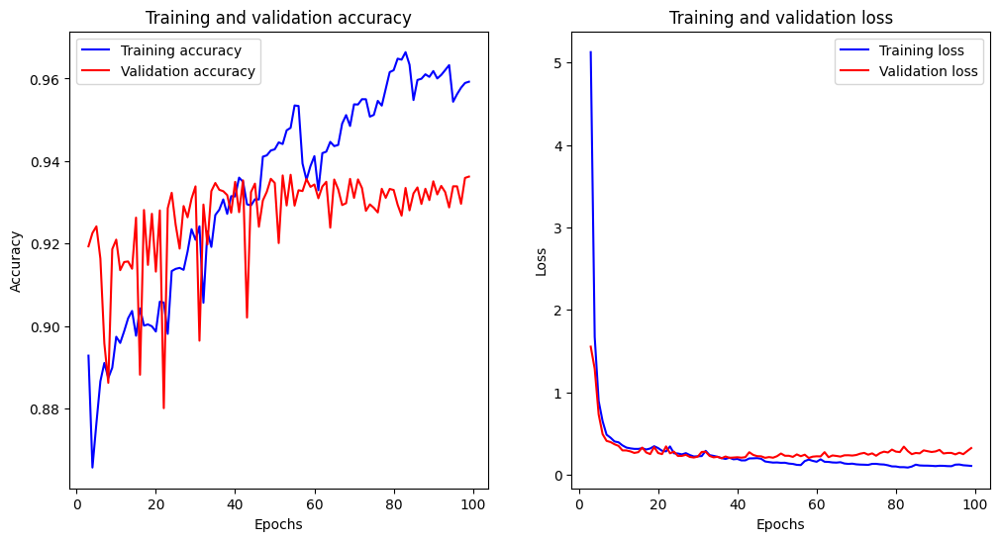

In [48]:
# 손실 그래프
epochs2 = range(3, len(history2.history["loss"]))
loss2 = history2.history["loss"][3:] # 3까지의 손실 함수가 너무 커서 제외
val_loss2 = history2.history["val_loss"][3:]

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.plot(epochs2, loss2, "b", label="Training loss")
plt.plot(epochs2, val_loss2, label="Validation loss", color = 'red')
plt.title("Training and validation loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

# 정확도 그래프
acc2 = history2.history["accuracy"][3:]
val_acc2 = history2.history["val_accuracy"][3:]

plt.subplot(1, 2, 1)
plt.plot(epochs2, acc2, "b", label="Training accuracy")
plt.plot(epochs2, val_acc2, label="Validation accuracy", color = 'red')
plt.title("Training and validation accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()

plt.show()

In [51]:
from tensorflow.keras.models import load_model

test_loss2, test_accuracy2 = model2.evaluate(test_input_imgs, test_targets)

# 평가 결과 출력
print("Test Loss:", test_loss2)
print("Test Accuracy:", test_accuracy2)

1/1 [==============================] - 1s 597ms/step - loss: 0.6763 - accuracy: 0.8904
Test Loss: 0.6762967705726624
Test Accuracy: 0.8903793096542358


In [52]:
prediction2 = model2.predict(test_input_imgs)

1/1 [==============================] - 0s 379ms/step


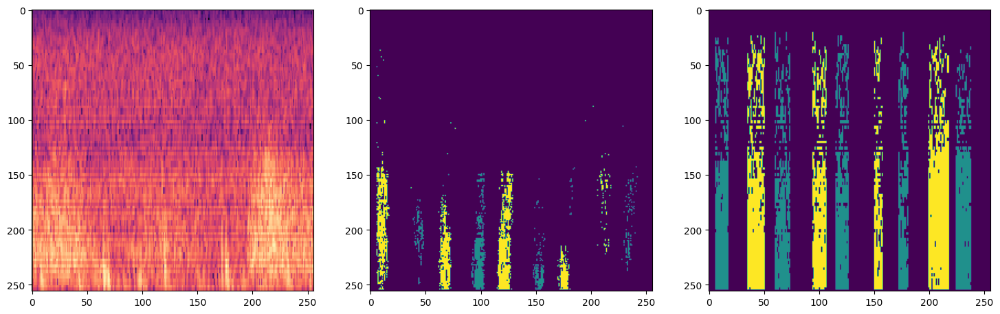

In [53]:
plt.figure(figsize=(18, 6))
plt.subplot(1,3,1)
plt.imshow(test_input_imgs[0]/255)

plt.subplot(1,3,2)
output2 = np.argmax(prediction2[0], axis=-1)
plt.imshow(output2)

plt.subplot(1,3,3)
plt.imshow(test_targets[0])

In [54]:
def calculate_iou(y_true, y_pred):
    intersection = np.logical_and(y_true, y_pred)
    union = np.logical_or(y_true, y_pred)
    iou = np.sum(intersection) / np.sum(union)
    return iou

IoU for sample 1: 0.04604178921993844


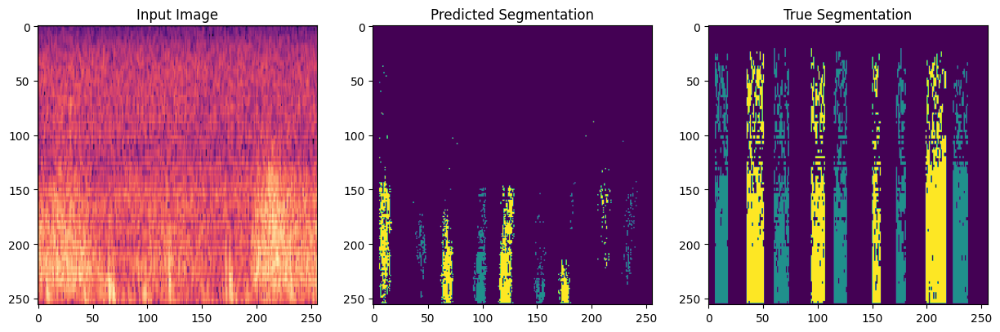

IoU for sample 2: 0.004851135360975389


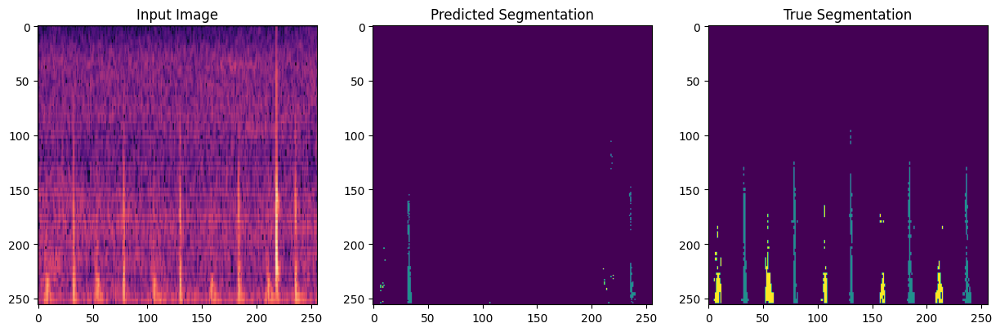

IoU for sample 3: 0.023041491737796686


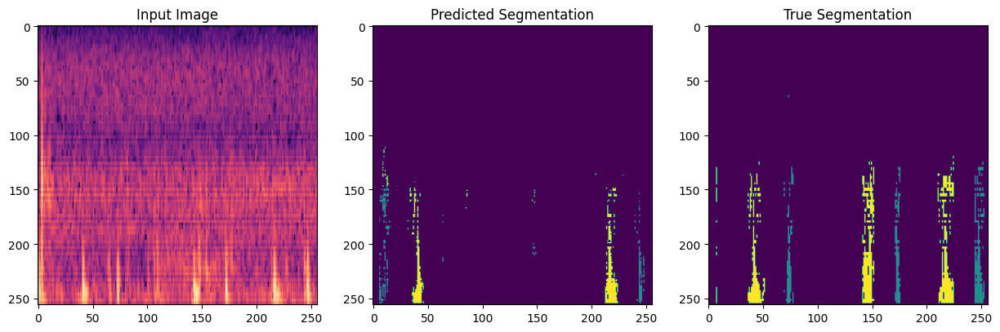

IoU for sample 4: 0.038962647429081086


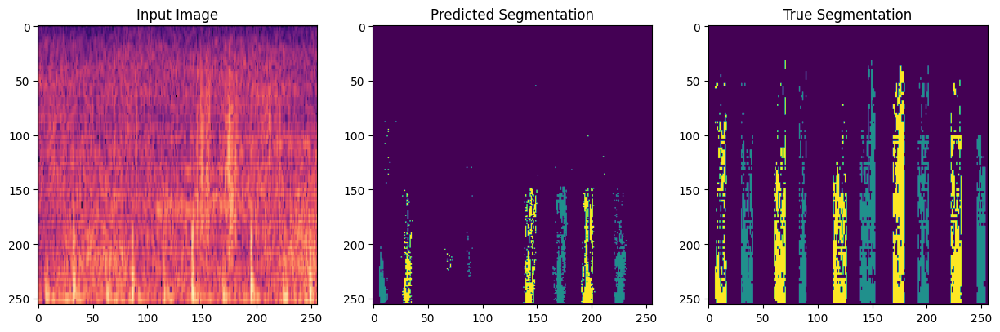

IoU for sample 5: 0.009478179060944926


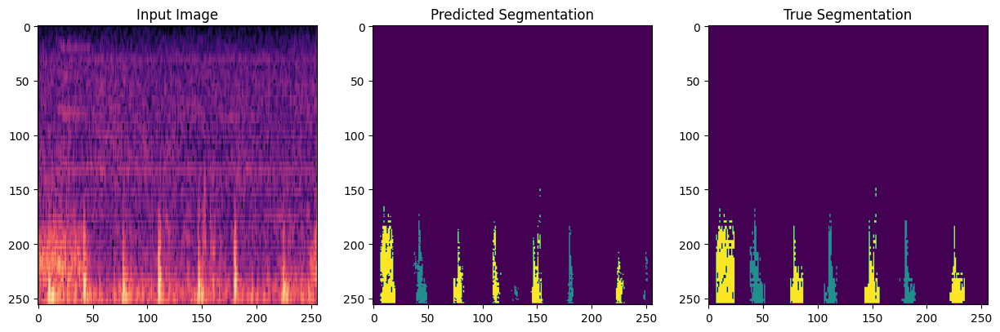

IoU for sample 6: 0.010292459222546


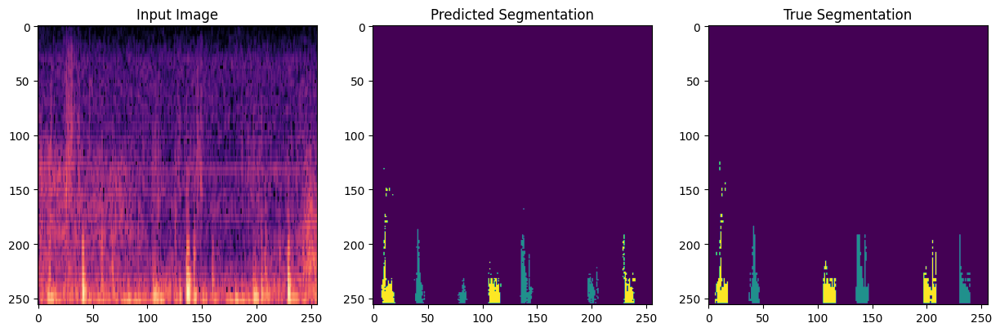

IoU for sample 7: 0.01912162569175447


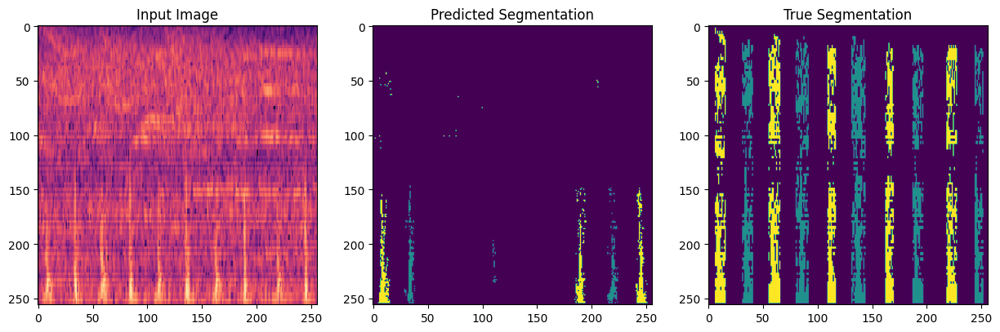

IoU for sample 8: 0.04918452761157884


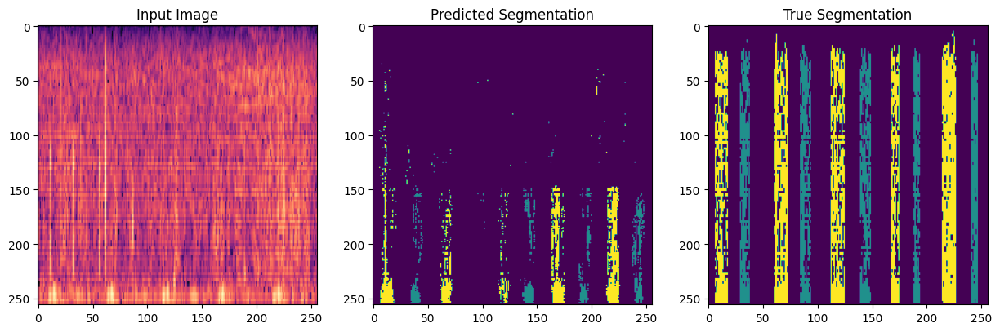

IoU for sample 9: 0.007942708613580877


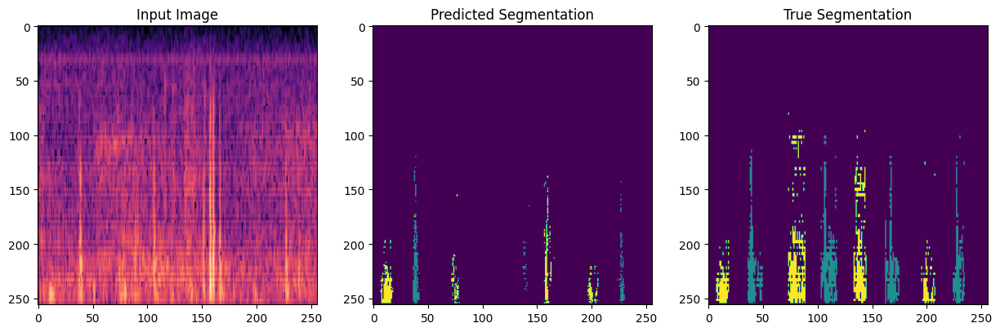

IoU for sample 10: 0.009169535315997698


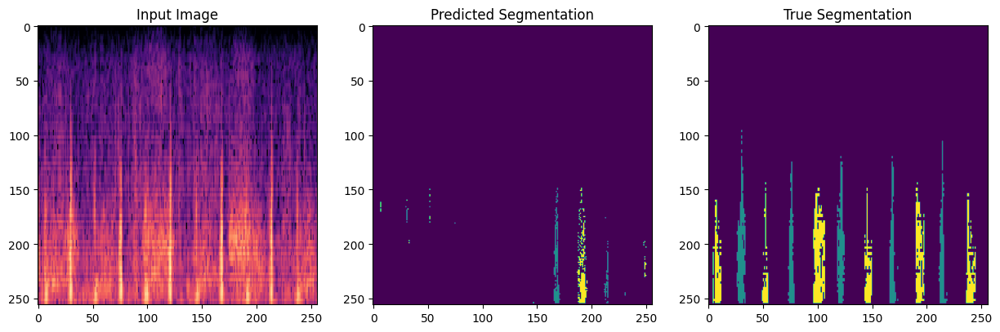

In [55]:
# IoU 계산 및 출력
iou_values2 = []

for i in range(len(test_input_imgs)):
    # 시각화를 위한 subplot 설정
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(test_input_imgs[i] / 255)
    plt.title("Input Image")

    plt.subplot(1, 3, 2)
    output2 = np.argmax(prediction2[i], axis=-1)
    plt.imshow(output2)
    plt.title("Predicted Segmentation")

    plt.subplot(1, 3, 3)
    plt.imshow(test_targets[i])
    plt.title("True Segmentation")

    # IoU 계산 및 출력
    iou2 = calculate_iou(test_targets[i], output2)
    iou_values2.append(iou2)
    print(f"IoU for sample {i + 1}: {iou2}")

    # 시각화를 위한 subplot 초기화
    plt.show()

In [56]:
# 전체 평균 IoU 출력
average_iou2 = np.mean(iou_values2)
print(f"\nAverage IoU across all samples: {average_iou2}")


Average IoU across all samples: 0.02180860992641944


**이것 역시, 클래스 별로 IoU 구하는 새로운 IoU 만들어 보자!**

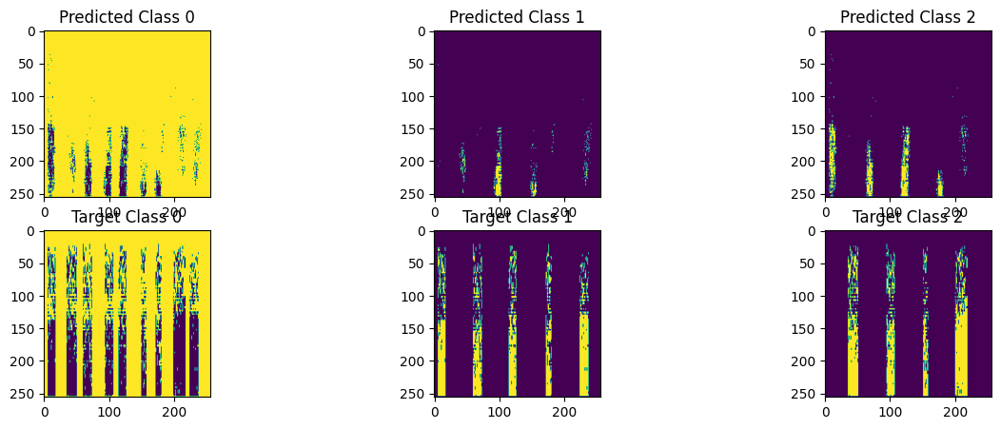

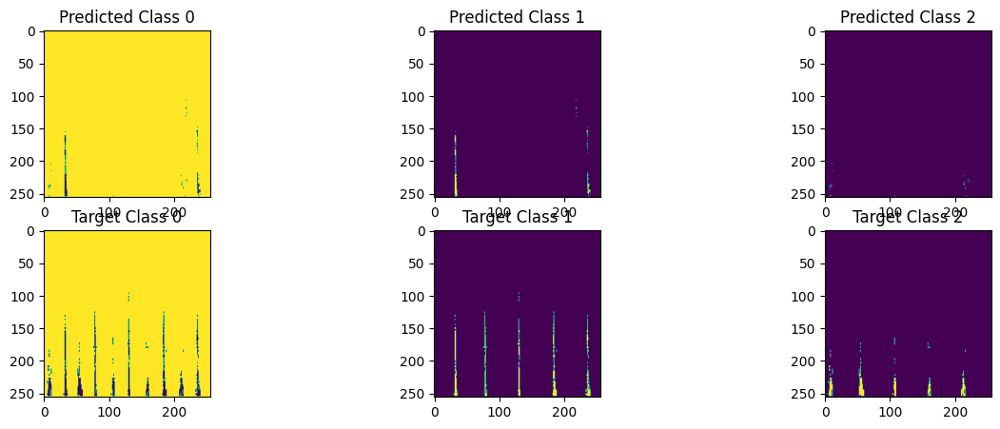

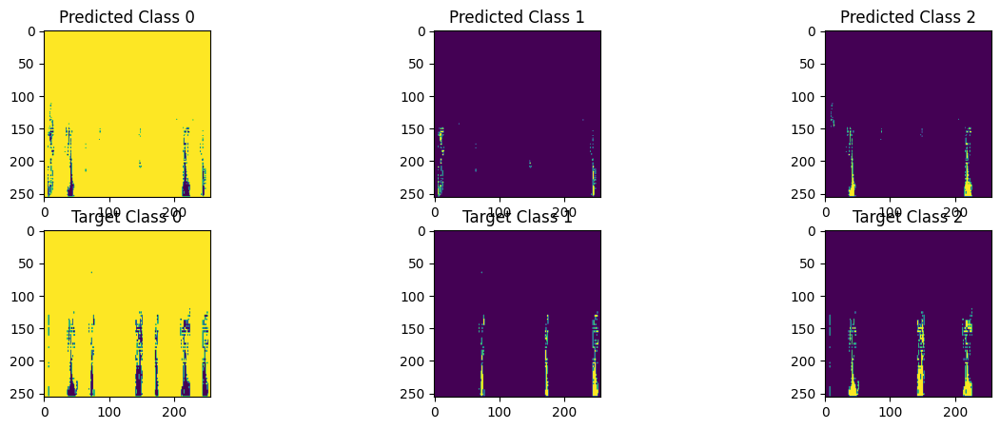

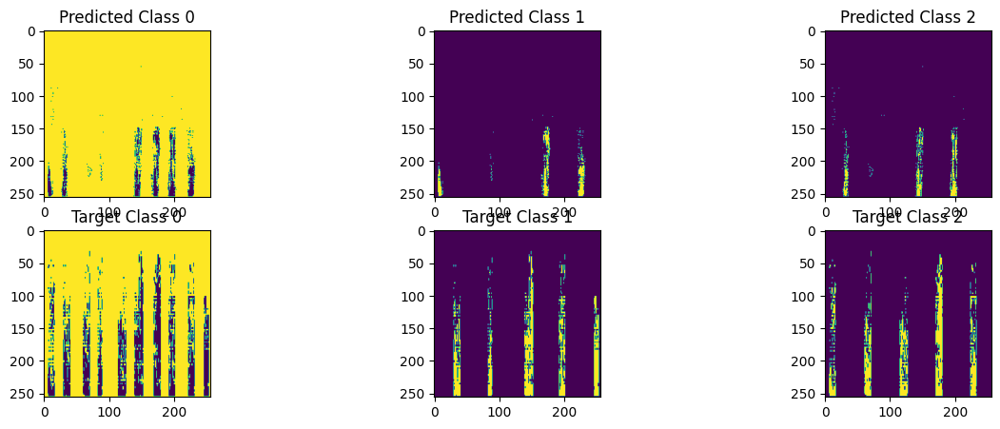

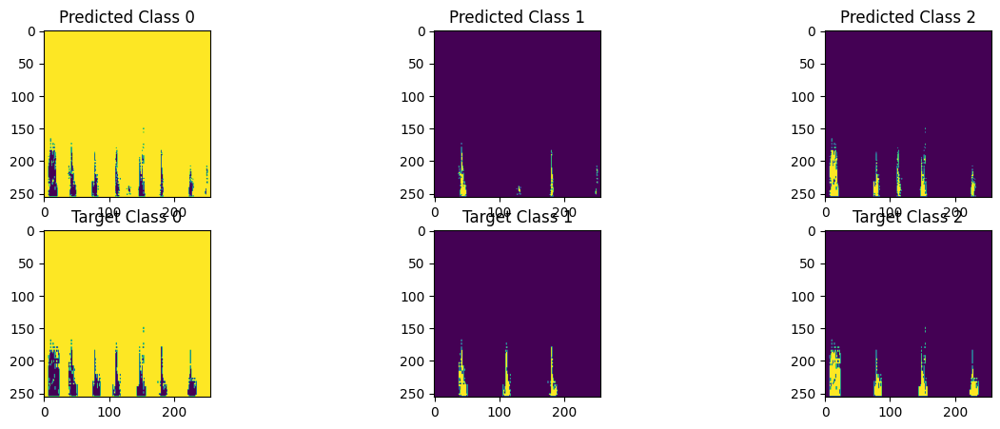

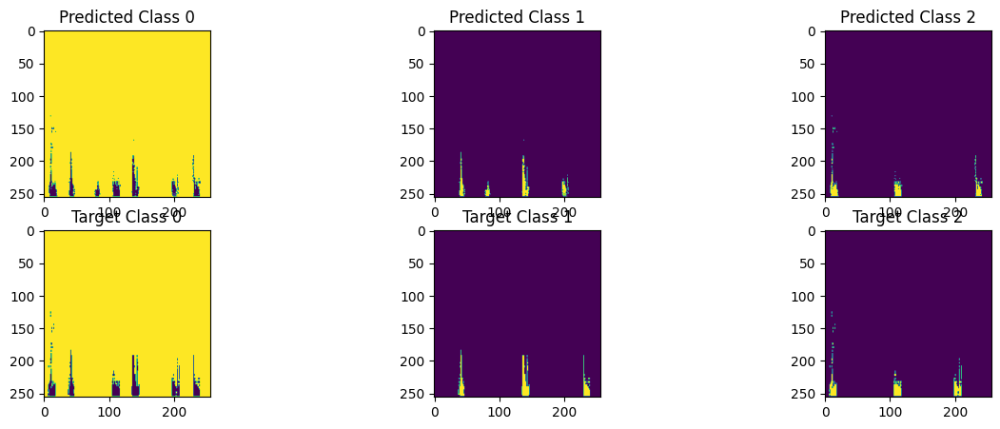

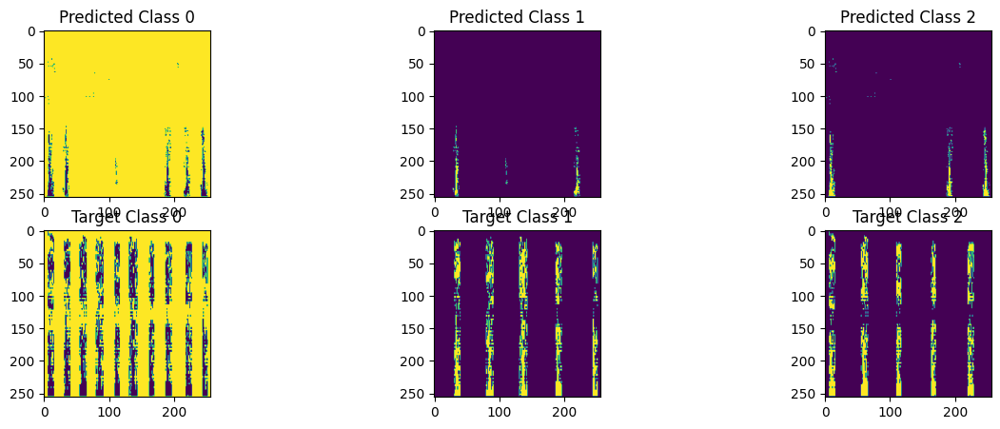

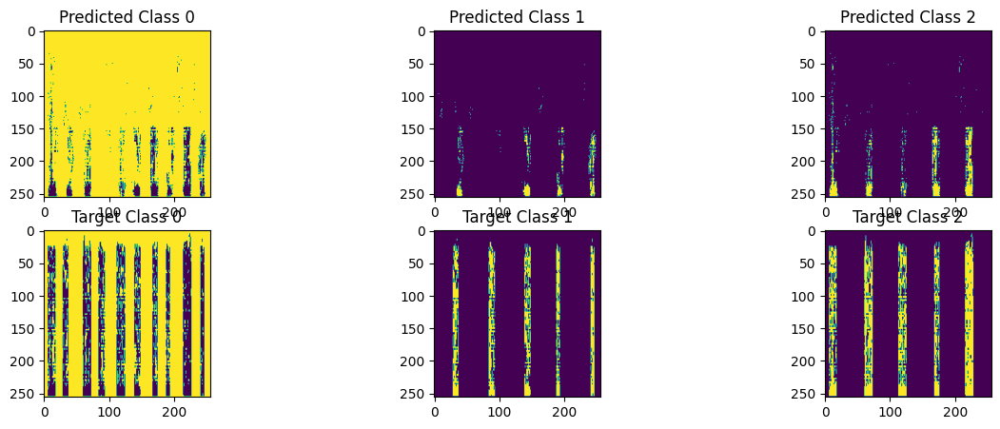

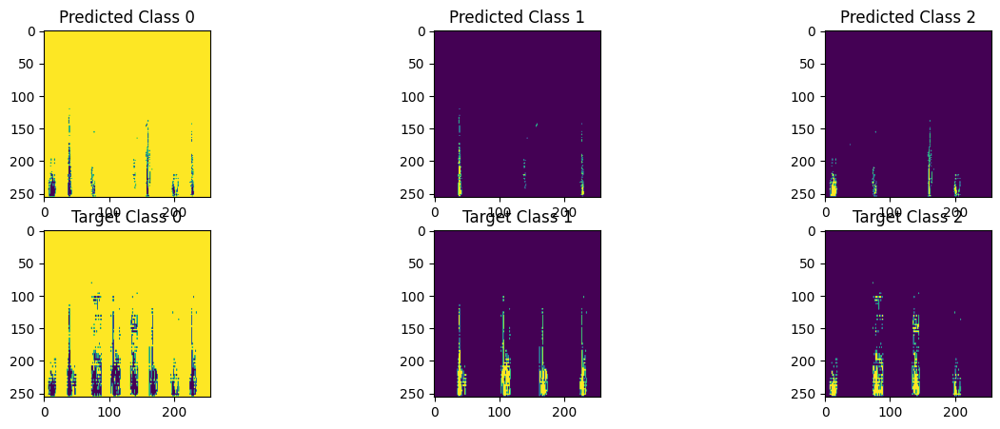

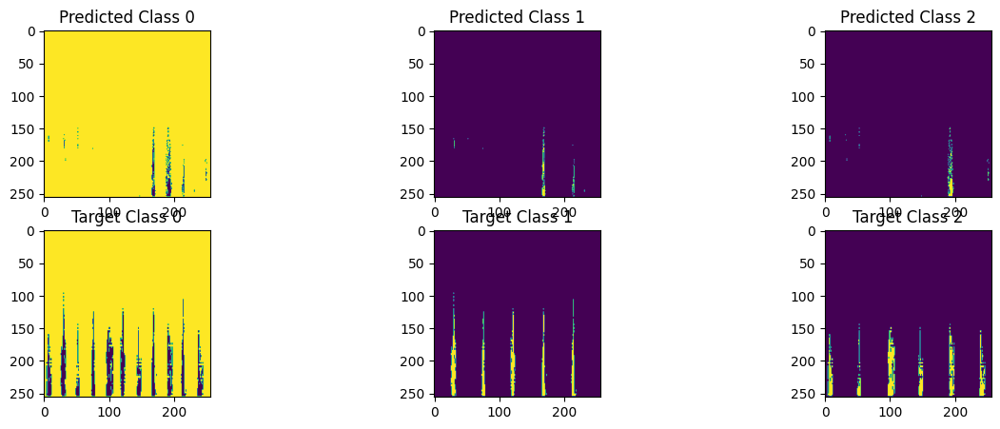

In [57]:
from tensorflow.keras.models import load_model
import numpy as np
import matplotlib.pyplot as plt

# IoU 계산 함수
def calculate_iou(y_true, y_pred, class_index):
    intersection = np.logical_and(y_true == class_index, y_pred == class_index)
    union = np.logical_or(y_true == class_index, y_pred == class_index)
    iou = np.sum(intersection) / np.sum(union)
    return iou

for i in range(len(test_input_imgs)):
    # 시각화를 위한 subplot 설정
    plt.figure(figsize=(15, 5))

    # plt.subplot(1, 4, 1)
    # plt.imshow(test_input_imgs[i] / 255)
    # plt.title("Input Image")

    for class_index in range(3):  # 클래스 수에 따라 반복
        plt.subplot(2, 3, class_index + 1)
        output2 = np.argmax(prediction2[i], axis=-1)
        plt.imshow(output2 == class_index)
        plt.title(f"Predicted Class {class_index}")

        plt.subplot(2, 3, class_index + 4)
        plt.imshow(test_targets[i]==class_index)
        plt.title(f"Target Class {class_index}")

    # 시각화를 위한 subplot 초기화
    plt.show()


In [58]:
def calculate_iou_score(target, prediction):
# 각 픽셀별로 어떤 클래스로 예측하고 있는지를 알아야 함
# (128, 128, 6) -> (128, 128, 1)
    one_c_prediction = np.argmax(prediction, axis=2)
    one_c_target = target[:, :, 0]

    # 이미지의 전체 영역 크기 계산
    total_area = one_c_prediction.shape[0] ** 2

    # 각 클래스에 대한 IoU 및 영역 정보를 저장할 리스트 초기화
    IoUs = []
    areas = []

    for class_i in range(3):
        # 해당 클래스에 속하는 픽셀을 True로 설정
        pred = np.where(one_c_prediction==class_i, True, False)
        target = np.where(one_c_target==class_i, True, False)

        intersection = np.logical_and(target, pred) # 교집합
        union = np.logical_or(target, pred) # 합집합
        iou_score = np.sum(intersection) / np.sum(union)

        IoUs.append(iou_score) # IoU 결과 리스트 추가

        # 해당 클래스가 차지하는 영역 구하기
        area = pred.sum() / total_area
        areas.append(area)

    return IoUs, areas


In [59]:
IoUs2, areas2 = calculate_iou_score(targets[0], prediction2[0])

In [60]:
sum(IoUs2) / 3

0.35361759254186526

In [61]:
sum([iou * area for iou, area in zip(IoUs2, areas2)]) # 영역의 크기로 가중치

0.7832170385839811

***
**segnet**
![image-2.png](attachment:image-2.png)

In [62]:
from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, BatchNormalization

def build_model3(img_size, num_classes):
    inputs = Input(shape=img_size + (3,))
    rescaling = Rescaling(1./255)(inputs)

    # Block 1
    x = Conv2D(64, (3, 3), padding='same', activation='relu')(inputs)
    x = BatchNormalization()(x)
    x = Conv2D(64, (3, 3), padding='same', activation='relu')(x)
    x = BatchNormalization()(x)
    x, mask_1 = MaxPooling2D(pool_size=(2, 2))(x), x

    # Block 2
    x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
    x = BatchNormalization()(x)
    x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
    x = BatchNormalization()(x)
    x, mask_2 = MaxPooling2D(pool_size=(2, 2))(x), x

    # Block 3
    x = Conv2D(256, (3, 3), padding='same', activation='relu')(x)
    x = BatchNormalization()(x)
    x = Conv2D(256, (3, 3), padding='same', activation='relu')(x)
    x = BatchNormalization()(x)
    x = Conv2D(256, (3, 3), padding='same', activation='relu')(x)
    x = BatchNormalization()(x)
    x, mask_3 = MaxPooling2D(pool_size=(2, 2))(x), x

    # Block 4
    x = Conv2D(512, (3, 3), padding='same', activation='relu')(x)
    x = BatchNormalization()(x)
    x = Conv2D(512, (3, 3), padding='same', activation='relu')(x)
    x = BatchNormalization()(x)
    x = Conv2D(512, (3, 3), padding='same', activation='relu')(x)
    x = BatchNormalization()(x)
    x, mask_4 = MaxPooling2D(pool_size=(2, 2))(x), x

    # Decoder
    # Block 4
    x = UpSampling2D(size=(2, 2))(x)
    x = Conv2D(512, (3, 3), padding='same', activation='relu')(x)
    x = BatchNormalization()(x)
    x = Conv2D(512, (3, 3), padding='same', activation='relu')(x)
    x = BatchNormalization()(x)
    x = Conv2D(512, (3, 3), padding='same', activation='relu')(x)
    x = BatchNormalization()(x)
    x = x + mask_4

    # Block 3
    x = UpSampling2D(size=(2, 2))(x)
    x = Conv2D(256, (3, 3), padding='same', activation='relu')(x)
    x = BatchNormalization()(x)
    x = Conv2D(256, (3, 3), padding='same', activation='relu')(x)
    x = BatchNormalization()(x)
    x = Conv2D(256, (3, 3), padding='same', activation='relu')(x)
    x = BatchNormalization()(x)
    x = x + mask_3

    # Block 2
    x = UpSampling2D(size=(2, 2))(x)
    x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
    x = BatchNormalization()(x)
    x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
    x = BatchNormalization()(x)
    x = x + mask_2

    # Block 1
    x = UpSampling2D(size=(2, 2))(x)
    x = Conv2D(64, (3, 3), padding='same', activation='relu')(x)
    x = BatchNormalization()(x)
    x = Conv2D(64, (3, 3), padding='same', activation='relu')(x)
    x = BatchNormalization()(x)
    x = x + mask_1

    # Output layer
    outputs = Conv2D(num_classes, (1, 1), activation='softmax')(x)

    model = Model(inputs=inputs, outputs=outputs)
    return model

In [63]:
model3 = build_model3(img_size=img_size, num_classes=3)
model3.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d_60 (Conv2D)          (None, 256, 256, 64)         1792      ['input_3[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 256, 256, 64)         256       ['conv2d_60[0][0]']           
 Normalization)                                                                                   
                                                                                                  
 conv2d_61 (Conv2D)          (None, 256, 256, 64)         36928     ['batch_normalization[0]

In [64]:
from tensorflow.keras.callbacks import ModelCheckpoint

model3.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"])

callbacks = ModelCheckpoint("seg_model3_segnet.keras", save_best_only=True)

history3 = model3.fit(train_input_imgs, train_targets,
                    epochs=100,
                    callbacks=callbacks,
                    batch_size=16,
                    validation_data=(val_input_imgs, val_targets))


Epoch 1/100
5/5 [==============================] - 18s 1s/step - loss: 1.6796 - accuracy: 0.4191 - val_loss: 2856.7754 - val_accuracy: 0.0354
Epoch 2/100
5/5 [==============================] - 4s 842ms/step - loss: 1.0151 - accuracy: 0.6678 - val_loss: 67716.7031 - val_accuracy: 0.0353
Epoch 3/100
5/5 [==============================] - 4s 816ms/step - loss: 0.8694 - accuracy: 0.8063 - val_loss: 9431.6348 - val_accuracy: 0.8656
Epoch 4/100
5/5 [==============================] - 4s 845ms/step - loss: 0.7729 - accuracy: 0.8479 - val_loss: 6978.9077 - val_accuracy: 0.8959
Epoch 5/100
5/5 [==============================] - 4s 821ms/step - loss: 0.6977 - accuracy: 0.8744 - val_loss: 2902.9241 - val_accuracy: 0.9036
Epoch 6/100
5/5 [==============================] - 5s 1s/step - loss: 0.6348 - accuracy: 0.8870 - val_loss: 1712.2478 - val_accuracy: 0.9078
Epoch 7/100
5/5 [==============================] - 5s 1s/step - loss: 0.5835 - accuracy: 0.8989 - val_loss: 873.9025 - val_accuracy: 0.9116


## 학습 결과 평가 - segnet

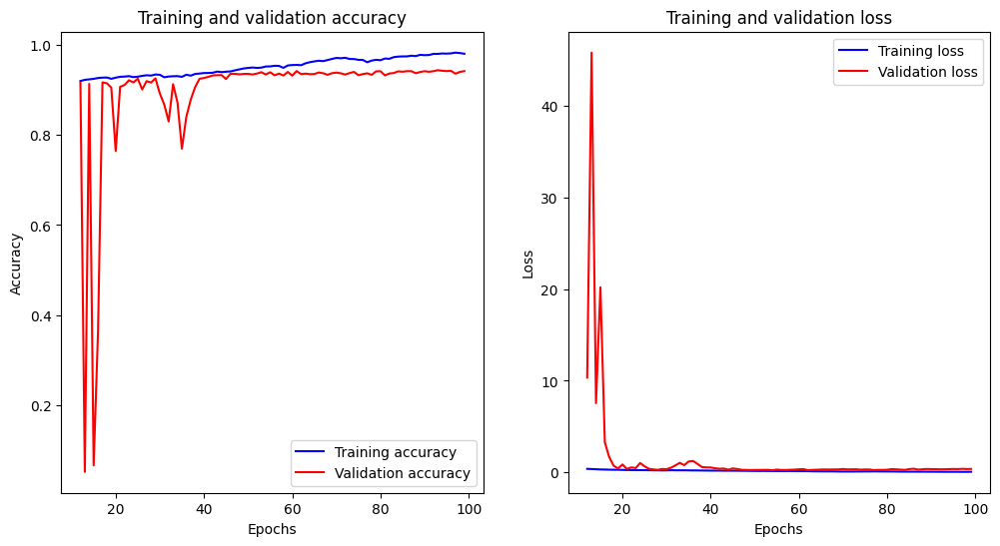

In [65]:
# 손실 그래프
epochs3 = range(12, len(history3.history["loss"])) # 12의 손실 함수가 너무 커서 그 이후로
loss3 = history3.history["loss"][12:]
val_loss3 = history3.history["val_loss"][12:]

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.plot(epochs3, loss3, "b", label="Training loss")
plt.plot(epochs3, val_loss3, label="Validation loss", color = 'red')
plt.title("Training and validation loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

# 정확도 그래프
acc3 = history3.history["accuracy"][12:]
val_acc3 = history3.history["val_accuracy"][12:]

plt.subplot(1, 2, 1)
plt.plot(epochs3, acc3, "b", label="Training accuracy")
plt.plot(epochs3, val_acc3, label="Validation accuracy", color = 'red')
plt.title("Training and validation accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()

plt.show()

In [66]:
from tensorflow.keras.models import load_model

test_loss3, test_accuracy3 = model3.evaluate(test_input_imgs, test_targets)

# 평가 결과 출력
print("Test Loss:", test_loss3)
print("Test Accuracy:", test_accuracy3)

1/1 [==============================] - 0s 256ms/step - loss: 0.3829 - accuracy: 0.9106
Test Loss: 0.3828917145729065
Test Accuracy: 0.9106003046035767


In [67]:
prediction3 = model3.predict(test_input_imgs)

1/1 [==============================] - 1s 555ms/step


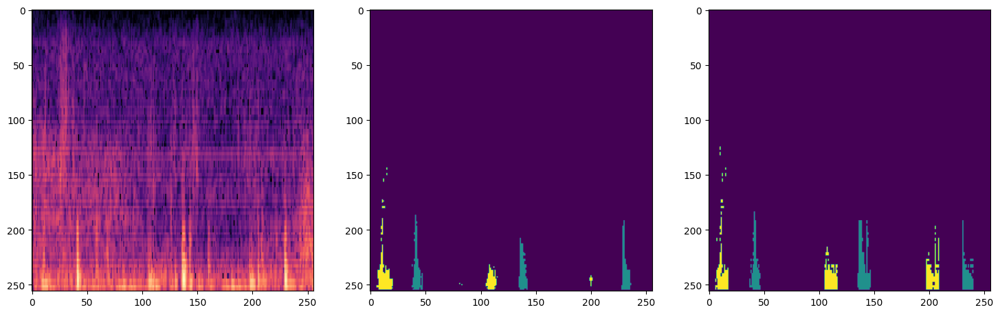

In [68]:
plt.figure(figsize=(18, 6))
plt.subplot(1,3,1)
plt.imshow(test_input_imgs[5]/255)

plt.subplot(1,3,2)
output3 = np.argmax(prediction3[5], axis=-1)
plt.imshow(output3)

plt.subplot(1,3,3)
plt.imshow(test_targets[5])

In [69]:
def calculate_iou(y_true, y_pred):
    intersection = np.logical_and(y_true, y_pred)
    union = np.logical_or(y_true, y_pred)
    iou = np.sum(intersection) / np.sum(union)
    return iou

IoU for sample 1: 0.07055950698072182


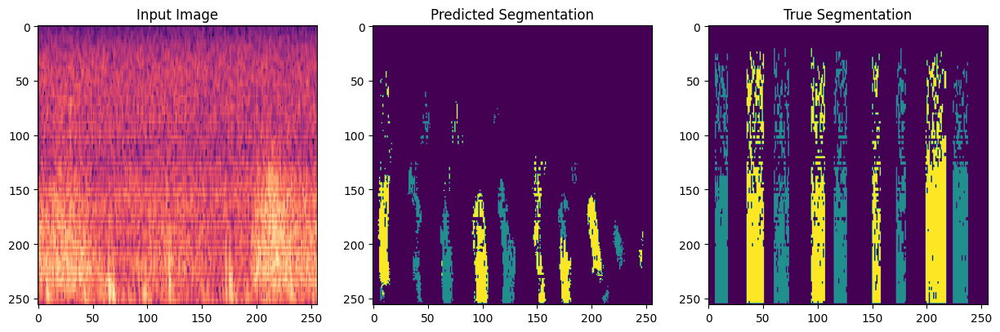

IoU for sample 2: 0.010343149045997544


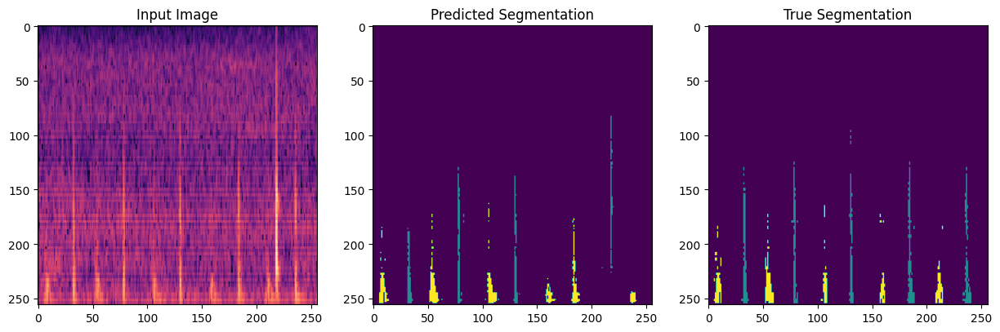

IoU for sample 3: 0.04001410240618618


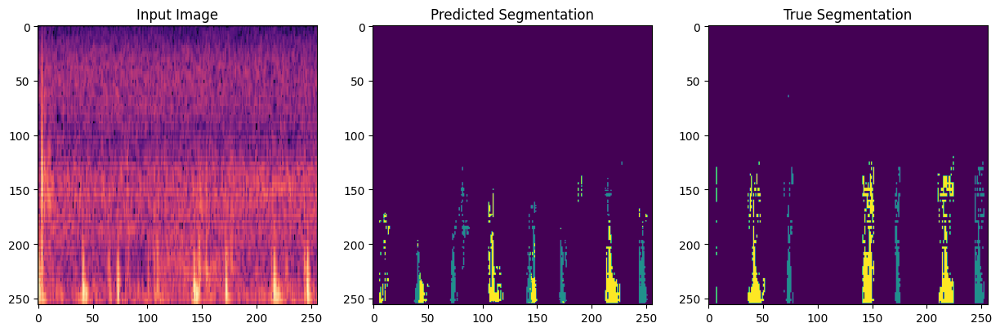

IoU for sample 4: 0.08193623709025595


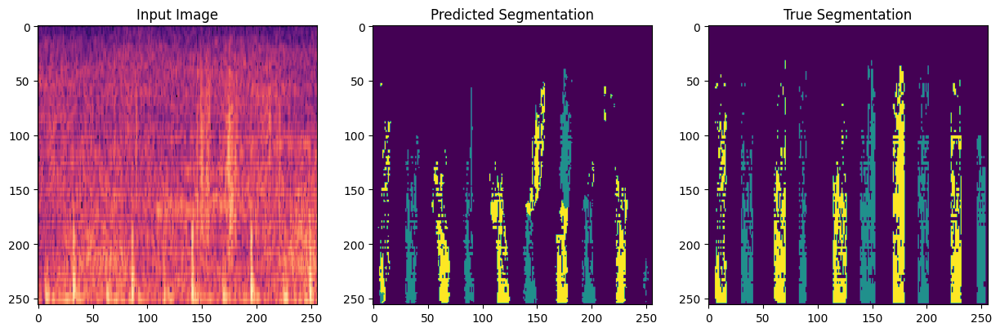

IoU for sample 5: 0.00950908111043573


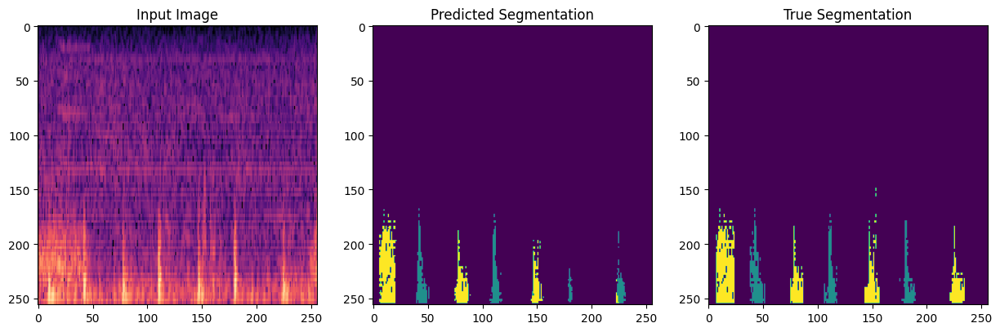

IoU for sample 6: 0.008661069958847736


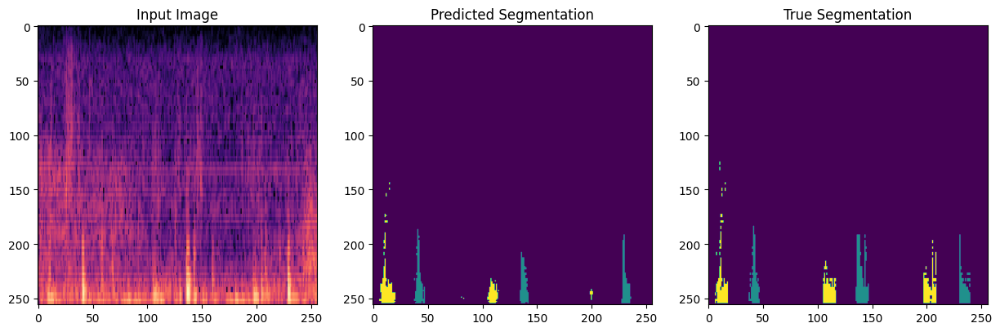

IoU for sample 7: 0.0496120820293856


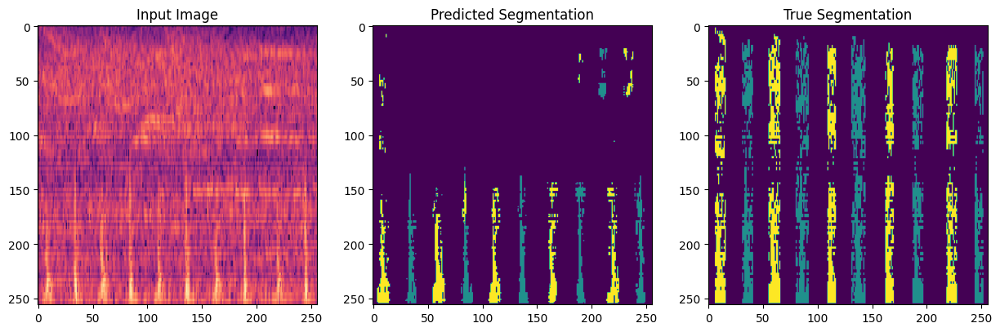

IoU for sample 8: 0.05460128284064829


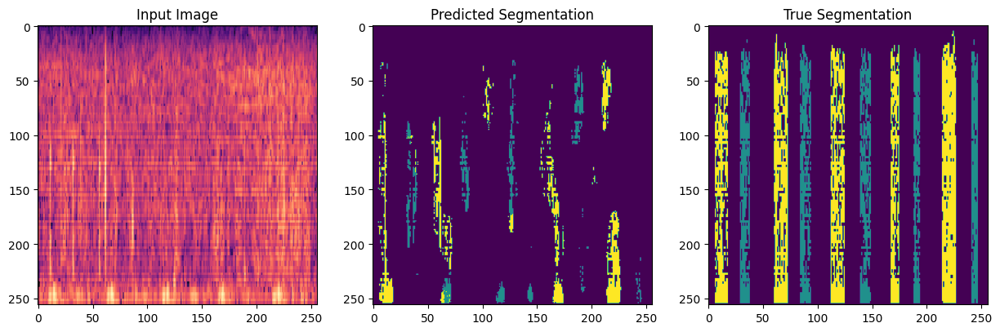

IoU for sample 9: 0.015812637090497416


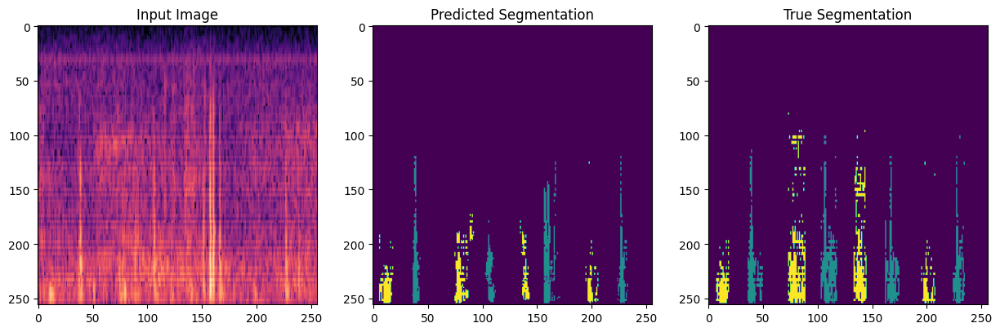

IoU for sample 10: 0.03303046815386272


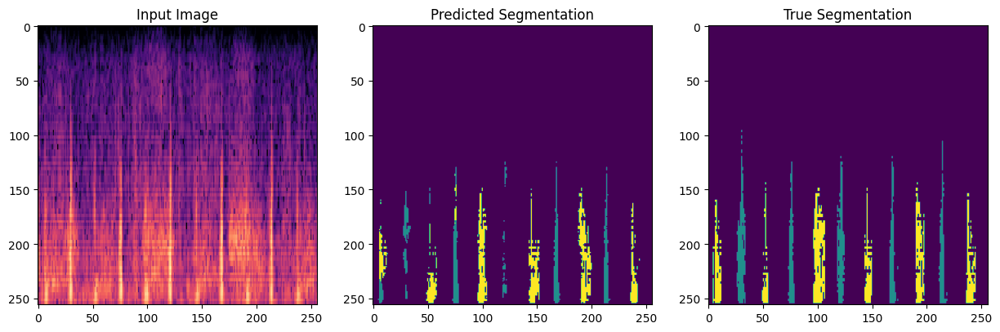

In [70]:
# IoU 계산 및 출력
iou_values3 = []

for i in range(len(test_input_imgs)):
    # 시각화를 위한 subplot 설정
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(test_input_imgs[i] / 255)
    plt.title("Input Image")

    plt.subplot(1, 3, 2)
    output3 = np.argmax(prediction3[i], axis=-1)
    plt.imshow(output3)
    plt.title("Predicted Segmentation")

    plt.subplot(1, 3, 3)
    plt.imshow(test_targets[i])
    plt.title("True Segmentation")

    # IoU 계산 및 출력
    iou3 = calculate_iou(test_targets[i], output3)
    iou_values3.append(iou3)
    print(f"IoU for sample {i + 1}: {iou3}")

    # 시각화를 위한 subplot 초기화
    plt.show()

In [ ]:
# 전체 평균 IoU 출력
average_iou3 = np.mean(iou_values3)
print(f"\nAverage IoU across all samples: {average_iou3}")


Average IoU across all samples: 0.8483908592281825


**이것 역시, 클래스 별로 IoU 구하는 새로운 IoU 만들어 보자!**

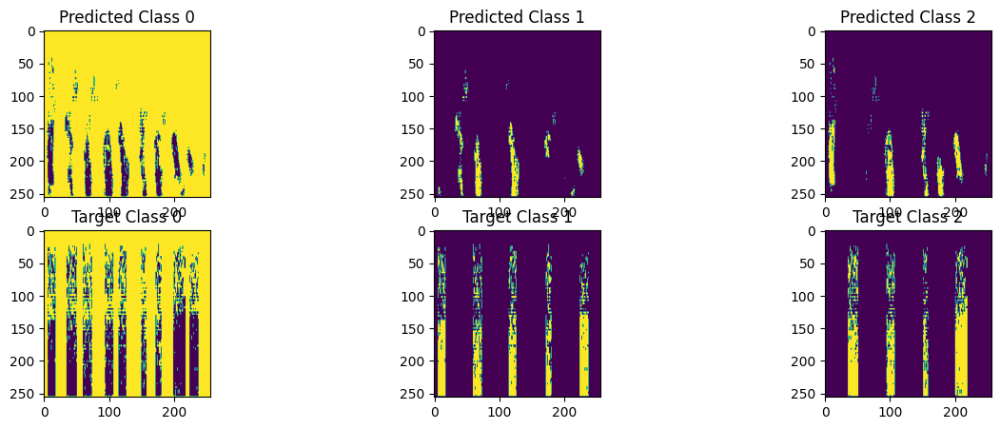

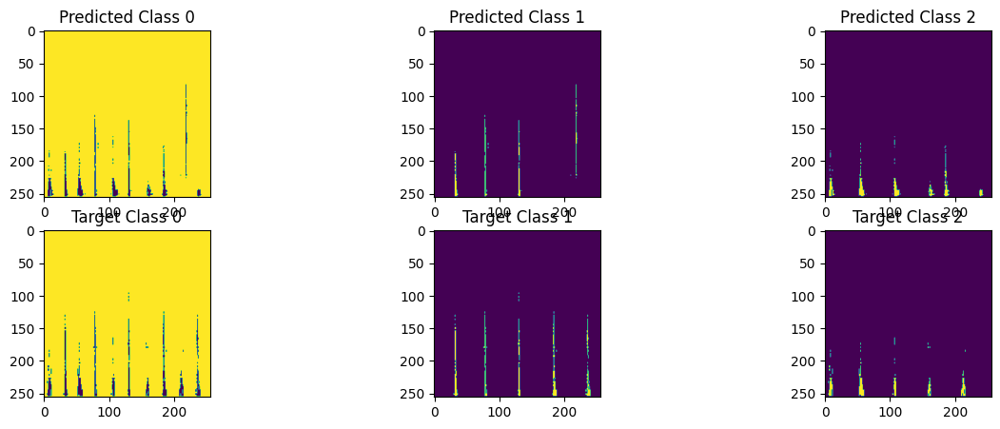

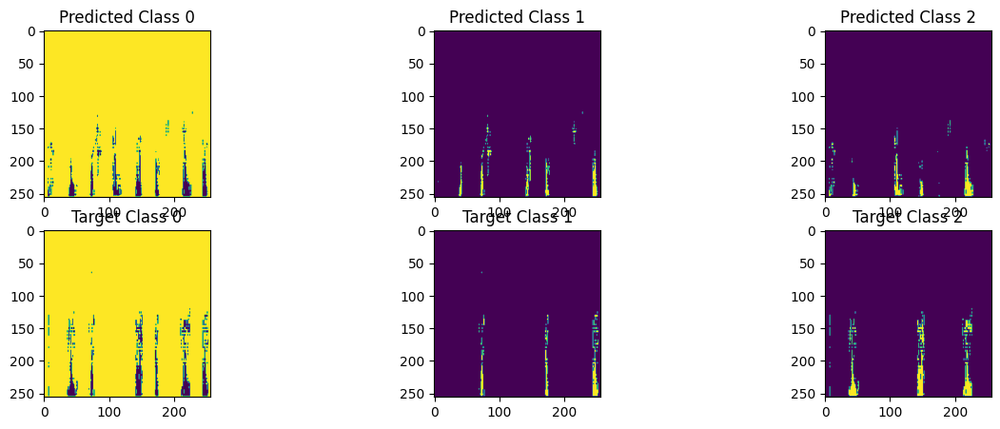

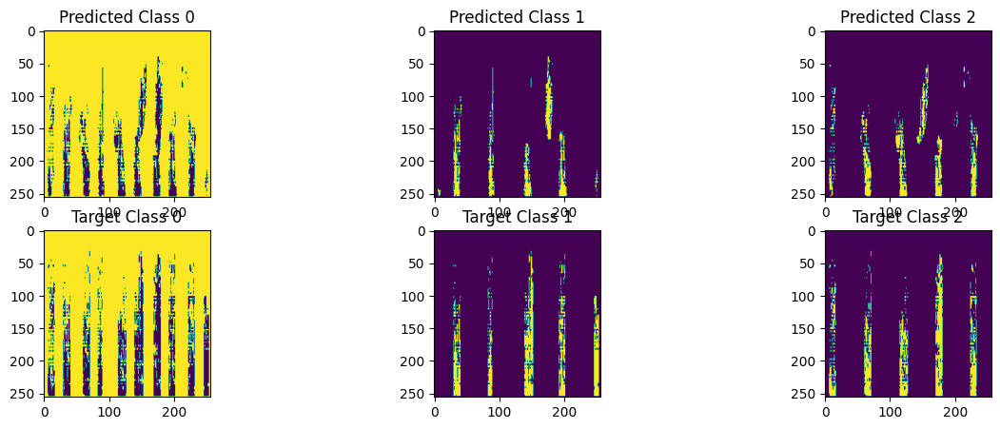

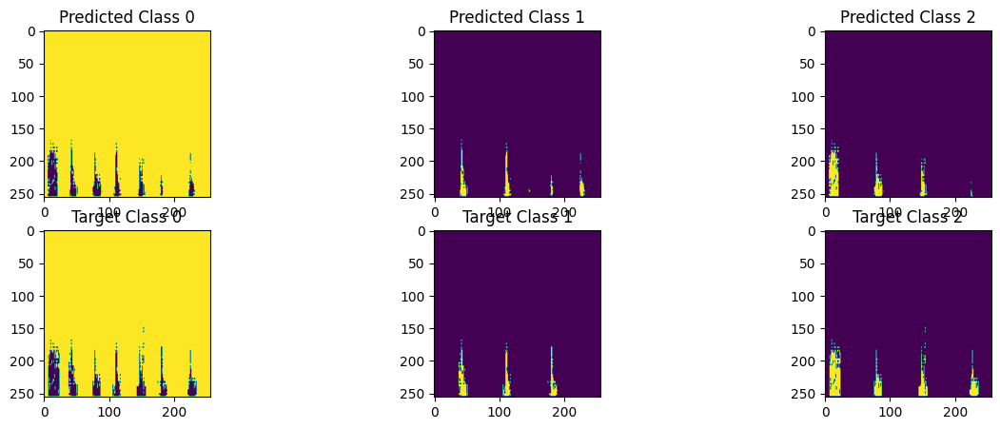

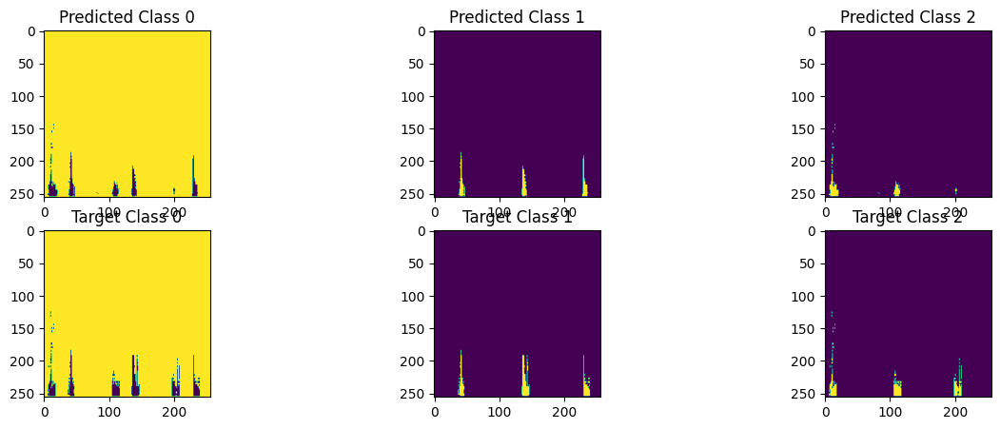

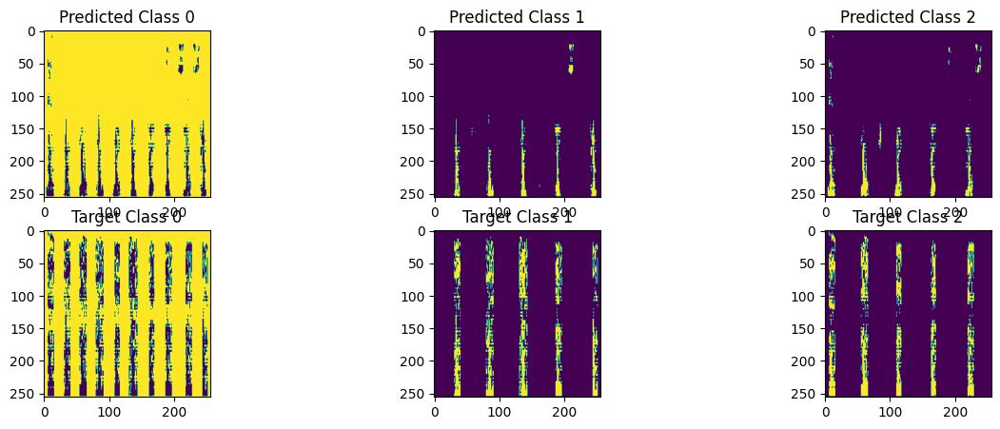

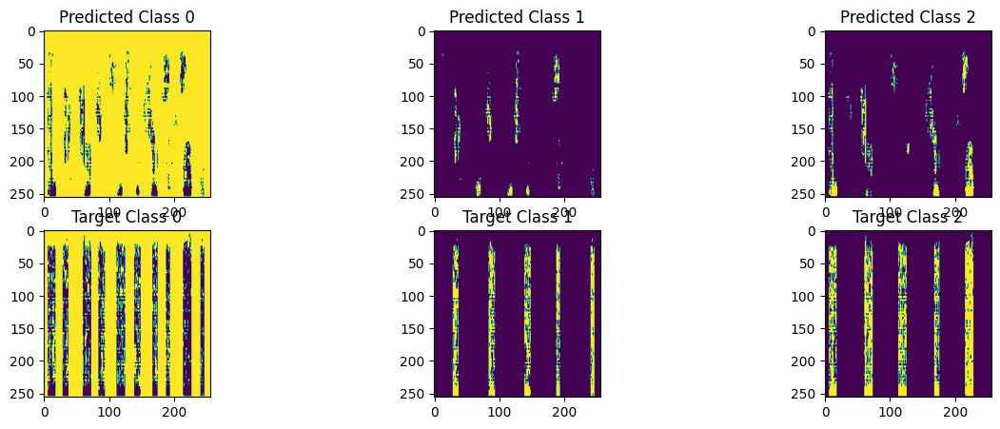

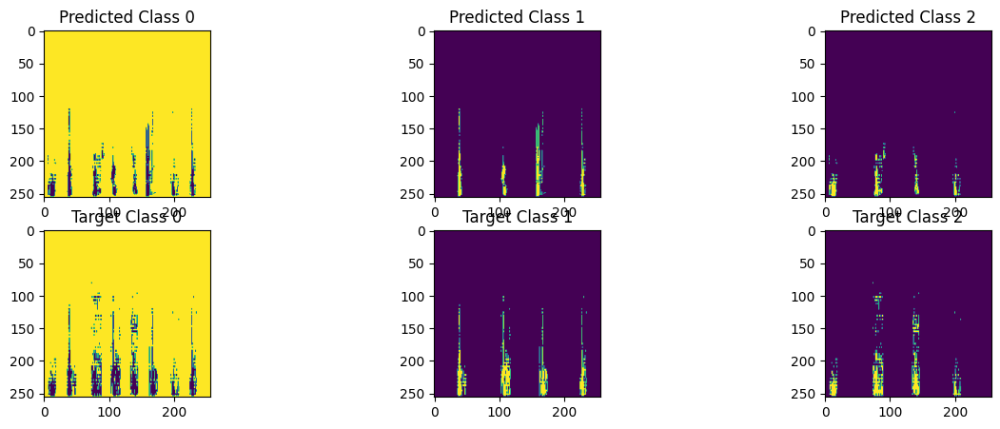

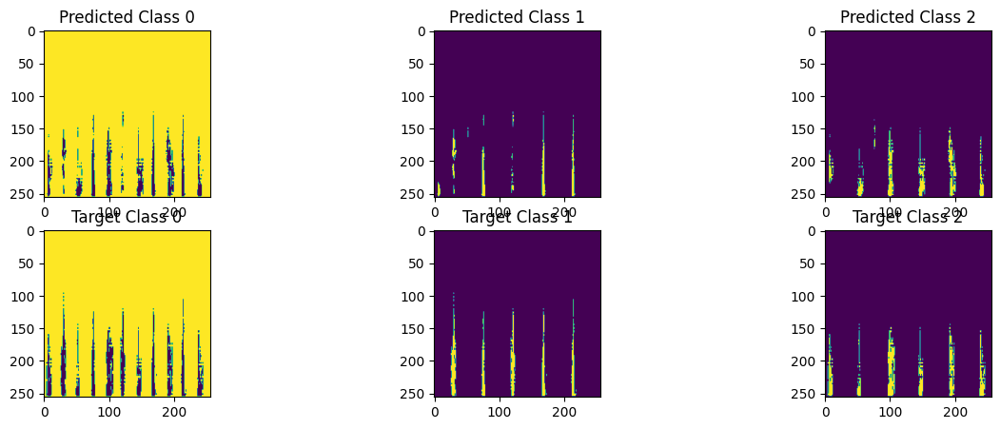

In [71]:
from tensorflow.keras.models import load_model
import numpy as np
import matplotlib.pyplot as plt

# IoU 계산 함수
def calculate_iou(y_true, y_pred, class_index):
    intersection = np.logical_and(y_true == class_index, y_pred == class_index)
    union = np.logical_or(y_true == class_index, y_pred == class_index)
    iou = np.sum(intersection) / np.sum(union)
    return iou

for i in range(len(test_input_imgs)):
    # 시각화를 위한 subplot 설정
    plt.figure(figsize=(15, 5))

    # plt.subplot(1, 4, 1)
    # plt.imshow(test_input_imgs[i] / 255)
    # plt.title("Input Image")

    for class_index in range(3):  # 클래스 수에 따라 반복
        plt.subplot(2, 3, class_index + 1)
        output3 = np.argmax(prediction3[i], axis=-1)
        plt.imshow(output3 == class_index)
        plt.title(f"Predicted Class {class_index}")

        plt.subplot(2, 3, class_index + 4)
        plt.imshow(test_targets[i]==class_index)
        plt.title(f"Target Class {class_index}")

    # 시각화를 위한 subplot 초기화
    plt.show()

In [72]:
def calculate_iou_score(target, prediction):
# 각 픽셀별로 어떤 클래스로 예측하고 있는지를 알아야 함
# (128, 128, 6) -> (128, 128, 1)
    one_c_prediction = np.argmax(prediction, axis=2)
    one_c_target = target[:, :, 0]

    # 이미지의 전체 영역 크기 계산
    total_area = one_c_prediction.shape[0] ** 2

    # 각 클래스에 대한 IoU 및 영역 정보를 저장할 리스트 초기화
    IoUs = []
    areas = []

    for class_i in range(3):
        # 해당 클래스에 속하는 픽셀을 True로 설정
        pred = np.where(one_c_prediction==class_i, True, False)
        target = np.where(one_c_target==class_i, True, False)

        intersection = np.logical_and(target, pred) # 교집합
        union = np.logical_or(target, pred) # 합집합
        iou_score = np.sum(intersection) / np.sum(union)

        IoUs.append(iou_score) # IoU 결과 리스트 추가

        # 해당 클래스가 차지하는 영역 구하기
        area = pred.sum() / total_area
        areas.append(area)

    return IoUs, areas

In [73]:
IoUs3, areas3 = calculate_iou_score(targets[0], prediction3[0])

In [74]:
sum(IoUs3) / 6

0.156740133988299

In [75]:
sum([iou * area for iou, area in zip(IoUs3, areas3)]) # 영역의 크기로 가중치

0.7418429644371206

***
**Deeplab**
![image-2.png](attachment:image-2.png)

In [76]:
import os
import cv2
import numpy as np
from glob import glob
from scipy.io import loadmat
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [77]:
def convolution_block(
    block_input,
    num_filters=256,
    kernel_size=3,
    dilation_rate=1,
    padding="same",
    use_bias=False,
):
    x = layers.Conv2D(
        num_filters,
        kernel_size=kernel_size,
        dilation_rate=dilation_rate,
        padding="same",
        use_bias=use_bias,
        kernel_initializer=keras.initializers.HeNormal(),
    )(block_input)
    x = layers.BatchNormalization()(x)
    return tf.nn.relu(x)


def DilatedSpatialPyramidPooling(dspp_input):
    dims = dspp_input.shape
    x = layers.AveragePooling2D(pool_size=(dims[-3], dims[-2]))(dspp_input)
    x = convolution_block(x, kernel_size=1, use_bias=True)
    out_pool = layers.UpSampling2D(
        size=(dims[-3] // x.shape[1], dims[-2] // x.shape[2]), interpolation="bilinear",
    )(x)

    out_1 = convolution_block(dspp_input, kernel_size=1, dilation_rate=1)
    out_6 = convolution_block(dspp_input, kernel_size=3, dilation_rate=6)
    out_12 = convolution_block(dspp_input, kernel_size=3, dilation_rate=12)
    out_18 = convolution_block(dspp_input, kernel_size=3, dilation_rate=18)

    x = layers.Concatenate(axis=-1)([out_pool, out_1, out_6, out_12, out_18])
    output = convolution_block(x, kernel_size=1)
    return output

In [78]:
from tensorflow.keras.layers import Input, Rescaling, UpSampling2D, Conv2D, Concatenate
from tensorflow.keras import Model
import tensorflow.keras as keras
import tensorflow as tf

def DeeplabV3Plus(img_size, num_classes):
    inputs = Input(shape=img_size)
    rescaling = Rescaling(1./255)(inputs)

    resnet50 = keras.applications.ResNet50(
        weights="imagenet", include_top=False, input_tensor=rescaling
    )

    x = resnet50.get_layer("conv4_block6_2_relu").output
    x = DilatedSpatialPyramidPooling(x)

    input_a = UpSampling2D(
        size=(img_size[0] // 4 // int(x.shape[1]), img_size[1] // 4 // int(x.shape[2])),
        interpolation="bilinear",
    )(x)

    input_b = resnet50.get_layer("conv2_block3_2_relu").output
    input_b = convolution_block(input_b, num_filters=48, kernel_size=1)

    x = Concatenate(axis=-1)([input_a, input_b])
    x = convolution_block(x)
    x = convolution_block(x)
    x = UpSampling2D(
        size=(img_size[0] // int(x.shape[1]), img_size[1] // int(x.shape[2])),
        interpolation="bilinear",
    )(x)
    model_output = Conv2D(num_classes, kernel_size=(1, 1), padding="same")(x)

    return Model(inputs=inputs, outputs=model_output)

img_size = (256, 256, 3)
num_classes = 3  # Example number of classes
model4 = DeeplabV3Plus(img_size=img_size, num_classes=num_classes)
model4.summary()

94765736/94765736 [==============================] - 5s 0us/step
Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 rescaling_3 (Rescaling)     (None, 256, 256, 3)          0         ['input_4[0][0]']             
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 262, 262, 3)          0         ['rescaling_3[0][0]']         
                                                                                                  
 conv1_conv (Conv2D)         (None, 128, 128, 64)         9472      ['conv1_pad[0][0]']           
                           

In [79]:
from tensorflow.keras.callbacks import ModelCheckpoint

model4.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"])

callbacks = ModelCheckpoint("seg_model4_Deeplab.keras", save_best_only=True)

history4 = model4.fit(train_input_imgs, train_targets,
                    epochs=100,
                    callbacks=callbacks,
                    batch_size=16,
                    validation_data=(val_input_imgs, val_targets))


Epoch 1/100
5/5 [==============================] - 60s 2s/step - loss: 1.6959 - accuracy: 0.7362 - val_loss: 15.1410 - val_accuracy: 0.0314
Epoch 2/100
5/5 [==============================] - 3s 739ms/step - loss: 0.8156 - accuracy: 0.7835 - val_loss: 1.5340 - val_accuracy: 0.0314
Epoch 3/100
5/5 [==============================] - 2s 360ms/step - loss: 0.8269 - accuracy: 0.8079 - val_loss: 13.5882 - val_accuracy: 0.0314
Epoch 4/100
5/5 [==============================] - 3s 703ms/step - loss: 0.7227 - accuracy: 0.7759 - val_loss: 1.0986 - val_accuracy: 0.0314
Epoch 5/100
5/5 [==============================] - 2s 382ms/step - loss: 0.6748 - accuracy: 0.7179 - val_loss: 1.0986 - val_accuracy: 0.0314
Epoch 6/100
5/5 [==============================] - 2s 381ms/step - loss: 0.6299 - accuracy: 0.7367 - val_loss: 1.0986 - val_accuracy: 0.0314
Epoch 7/100
5/5 [==============================] - 2s 373ms/step - loss: 0.5616 - accuracy: 0.7828 - val_loss: 1.0986 - val_accuracy: 0.0603
Epoch 8/100
5

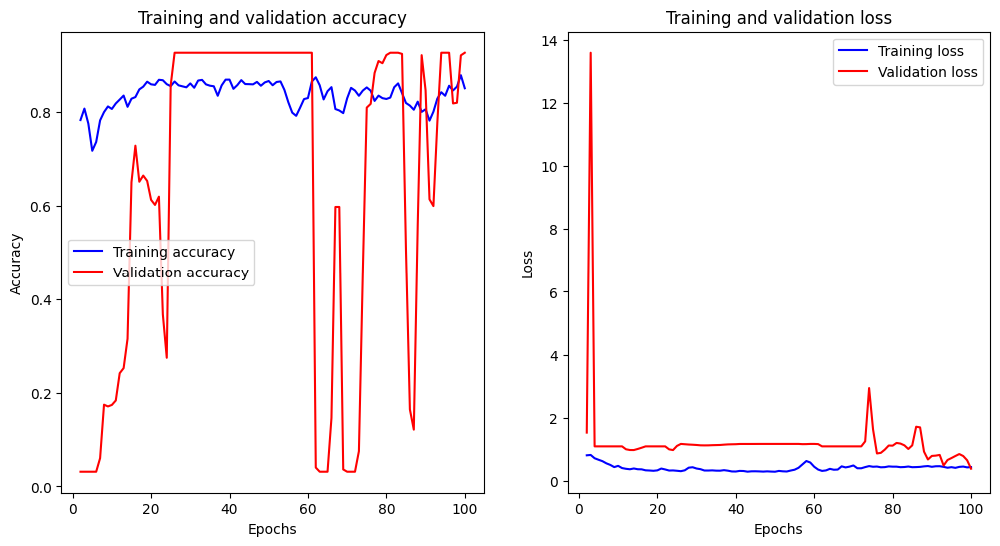

In [80]:
# 손실 그래프
epochs4 = range(2, len(history4.history["loss"]) + 1)
loss4 = history4.history["loss"][1:] # 1의 손실 함수가 너무 커서 제외
val_loss4 = history4.history["val_loss"][1:]

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.plot(epochs4, loss4, "b", label="Training loss")
plt.plot(epochs4, val_loss4, label="Validation loss", color = 'red')
plt.title("Training and validation loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

# 정확도 그래프
acc4 = history4.history["accuracy"][1:]
val_acc4 = history4.history["val_accuracy"][1:]

plt.subplot(1, 2, 1)
plt.plot(epochs4, acc4, "b", label="Training accuracy")
plt.plot(epochs4, val_acc4, label="Validation accuracy", color = 'red')
plt.title("Training and validation accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()

plt.show()

**아직 수렴하지 못하는 느낌.. 더 에폭 돌려보자!**

In [81]:
def convolution_block(
    block_input,
    num_filters=256,
    kernel_size=3,
    dilation_rate=1,
    padding="same",
    use_bias=False,
):
    x = layers.Conv2D(
        num_filters,
        kernel_size=kernel_size,
        dilation_rate=dilation_rate,
        padding="same",
        use_bias=use_bias,
        kernel_initializer=keras.initializers.HeNormal(),
    )(block_input)
    x = layers.BatchNormalization()(x)
    return tf.nn.relu(x)


def DilatedSpatialPyramidPooling(dspp_input):
    dims = dspp_input.shape
    x = layers.AveragePooling2D(pool_size=(dims[-3], dims[-2]))(dspp_input)
    x = convolution_block(x, kernel_size=1, use_bias=True)
    out_pool = layers.UpSampling2D(
        size=(dims[-3] // x.shape[1], dims[-2] // x.shape[2]), interpolation="bilinear",
    )(x)

    out_1 = convolution_block(dspp_input, kernel_size=1, dilation_rate=1)
    out_6 = convolution_block(dspp_input, kernel_size=3, dilation_rate=6)
    out_12 = convolution_block(dspp_input, kernel_size=3, dilation_rate=12)
    out_18 = convolution_block(dspp_input, kernel_size=3, dilation_rate=18)

    x = layers.Concatenate(axis=-1)([out_pool, out_1, out_6, out_12, out_18])
    output = convolution_block(x, kernel_size=1)
    return output

In [82]:
from tensorflow.keras.layers import Input, Rescaling, UpSampling2D, Conv2D, Concatenate
from tensorflow.keras import Model
import tensorflow.keras as keras
import tensorflow as tf

def DeeplabV3Plus(img_size, num_classes):
    inputs = Input(shape=img_size)
    rescaling = Rescaling(1./255)(inputs)

    resnet50 = keras.applications.ResNet50(
        weights="imagenet", include_top=False, input_tensor=rescaling
    )

    x = resnet50.get_layer("conv4_block6_2_relu").output
    x = DilatedSpatialPyramidPooling(x)

    input_a = UpSampling2D(
        size=(img_size[0] // 4 // int(x.shape[1]), img_size[1] // 4 // int(x.shape[2])),
        interpolation="bilinear",
    )(x)

    input_b = resnet50.get_layer("conv2_block3_2_relu").output
    input_b = convolution_block(input_b, num_filters=48, kernel_size=1)

    x = Concatenate(axis=-1)([input_a, input_b])
    x = convolution_block(x)
    x = convolution_block(x)
    x = UpSampling2D(
        size=(img_size[0] // int(x.shape[1]), img_size[1] // int(x.shape[2])),
        interpolation="bilinear",
    )(x)
    model_output = Conv2D(num_classes, kernel_size=(1, 1), padding="same")(x)

    return Model(inputs=inputs, outputs=model_output)

img_size = (256, 256, 3)
num_classes = 3  # Example number of classes
model4 = DeeplabV3Plus(img_size=img_size, num_classes=num_classes)
model4.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_5 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 rescaling_4 (Rescaling)     (None, 256, 256, 3)          0         ['input_5[0][0]']             
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 262, 262, 3)          0         ['rescaling_4[0][0]']         
                                                                                                  
 conv1_conv (Conv2D)         (None, 128, 128, 64)         9472      ['conv1_pad[0][0]']           
                                                                                            

In [83]:
from tensorflow.keras.callbacks import ModelCheckpoint

model4.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"])

callbacks = ModelCheckpoint("seg_model4_Deeplab.keras", save_best_only=True)

history4 = model4.fit(train_input_imgs, train_targets,
                    epochs=200,
                    callbacks=callbacks,
                    batch_size=16,
                    validation_data=(val_input_imgs, val_targets))


Epoch 1/200
5/5 [==============================] - 36s 963ms/step - loss: 3.0804 - accuracy: 0.6596 - val_loss: 15.4473 - val_accuracy: 0.0416
Epoch 2/200
5/5 [==============================] - 2s 353ms/step - loss: 1.1558 - accuracy: 0.7135 - val_loss: 15.4473 - val_accuracy: 0.0416
Epoch 3/200
5/5 [==============================] - 2s 373ms/step - loss: 0.9506 - accuracy: 0.6852 - val_loss: 15.4473 - val_accuracy: 0.0416
Epoch 4/200
5/5 [==============================] - 4s 803ms/step - loss: 0.8547 - accuracy: 0.6960 - val_loss: 12.5968 - val_accuracy: 0.0417
Epoch 5/200
5/5 [==============================] - 3s 766ms/step - loss: 0.7911 - accuracy: 0.7063 - val_loss: 1.2146 - val_accuracy: 0.4520
Epoch 6/200
5/5 [==============================] - 2s 360ms/step - loss: 0.6588 - accuracy: 0.6883 - val_loss: 1.2200 - val_accuracy: 0.9270
Epoch 7/200
5/5 [==============================] - 2s 374ms/step - loss: 0.6691 - accuracy: 0.6574 - val_loss: 1.2288 - val_accuracy: 0.9270
Epoch 8/

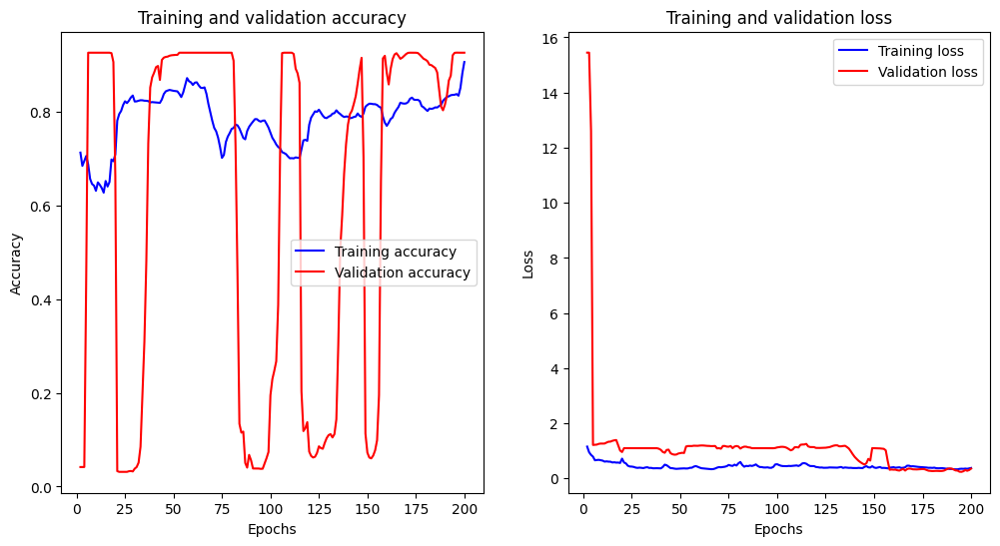

In [84]:
# 손실 그래프
epochs4 = range(2, len(history4.history["loss"]) + 1)
loss4 = history4.history["loss"][1:] # 1의 손실 함수가 너무 커서 제외
val_loss4 = history4.history["val_loss"][1:]

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
plt.plot(epochs4, loss4, "b", label="Training loss")
plt.plot(epochs4, val_loss4, label="Validation loss", color = 'red')
plt.title("Training and validation loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

# 정확도 그래프
acc4 = history4.history["accuracy"][1:]
val_acc4 = history4.history["val_accuracy"][1:]

plt.subplot(1, 2, 1)
plt.plot(epochs4, acc4, "b", label="Training accuracy")
plt.plot(epochs4, val_acc4, label="Validation accuracy", color = 'red')
plt.title("Training and validation accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()

plt.show()

In [85]:
from tensorflow.keras.models import load_model

# 저장된 모델 불러오기
loaded_model4 = load_model("seg_model4_Deeplab.keras")

test_loss4, test_accuracy4 = loaded_model4.evaluate(test_input_imgs, test_targets)

# 평가 결과 출력
print("Test Loss:", test_loss4)
print("Test Accuracy:", test_accuracy4)

1/1 [==============================] - 2s 2s/step - loss: 0.3677 - accuracy: 0.8758
Test Loss: 0.3677048087120056
Test Accuracy: 0.8757568597793579


In [86]:
prediction4 = loaded_model4.predict(test_input_imgs)

1/1 [==============================] - 1s 933ms/step


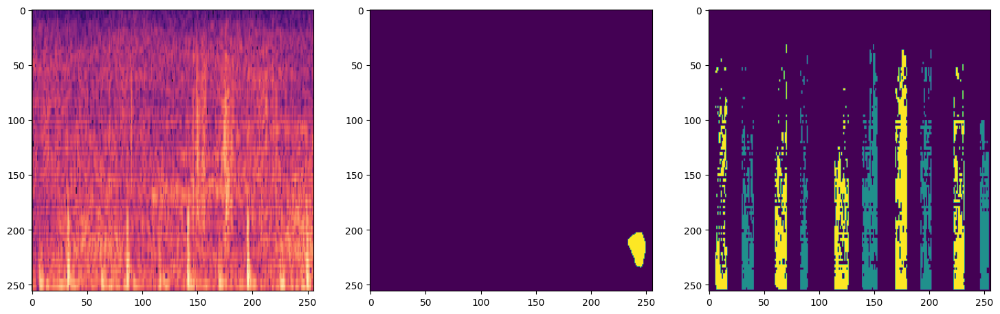

In [87]:
plt.figure(figsize=(18, 6))
plt.subplot(1,3,1)
plt.imshow(test_input_imgs[3]/255)

plt.subplot(1,3,2)
output4 = np.argmax(prediction4[3], axis=-1)
plt.imshow(output4)

plt.subplot(1,3,3)
plt.imshow(test_targets[3])

In [ ]:
def calculate_iou(y_true, y_pred):
    intersection = np.logical_and(y_true, y_pred)
    union = np.logical_or(y_true, y_pred)
    iou = np.sum(intersection) / np.sum(union)
    return iou

IoU for sample 1: 0.1420642731224113


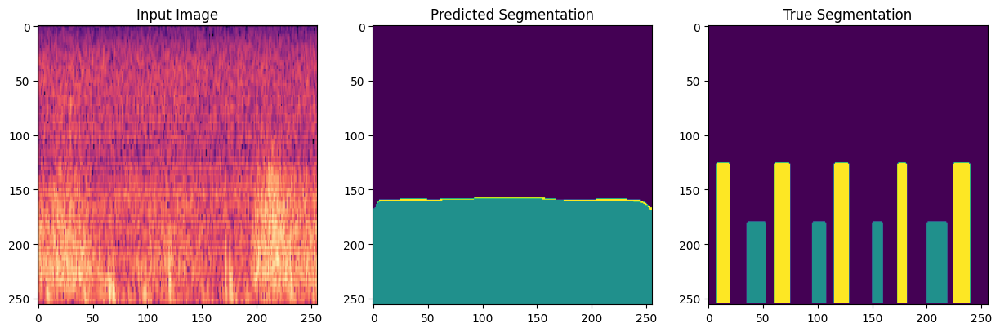

IoU for sample 2: 0.1169442507414828


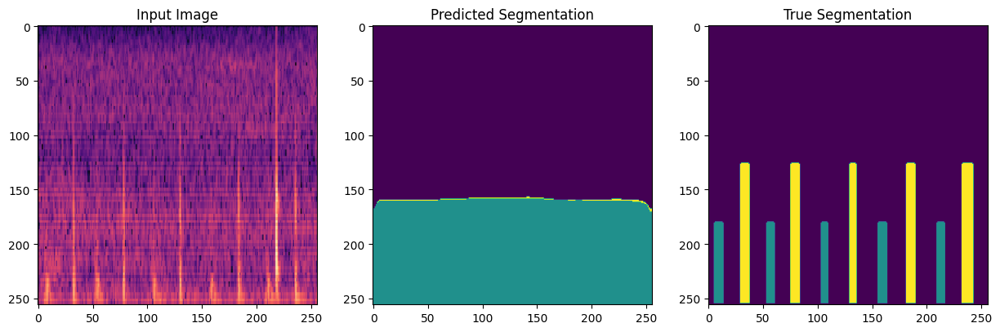

IoU for sample 3: 0.1122395006876124


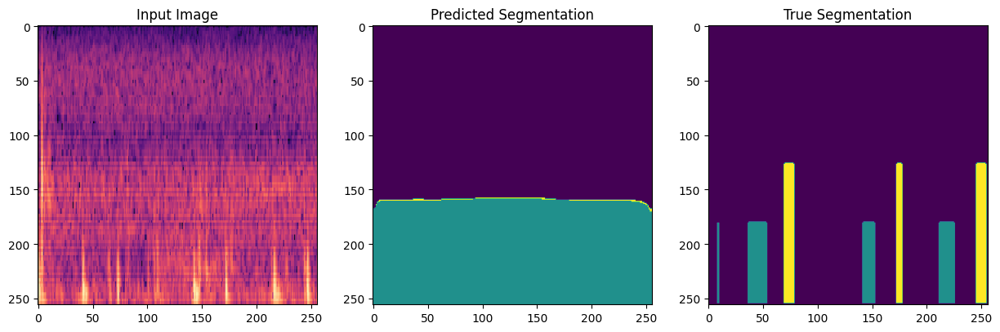

IoU for sample 4: 0.13490636239613046


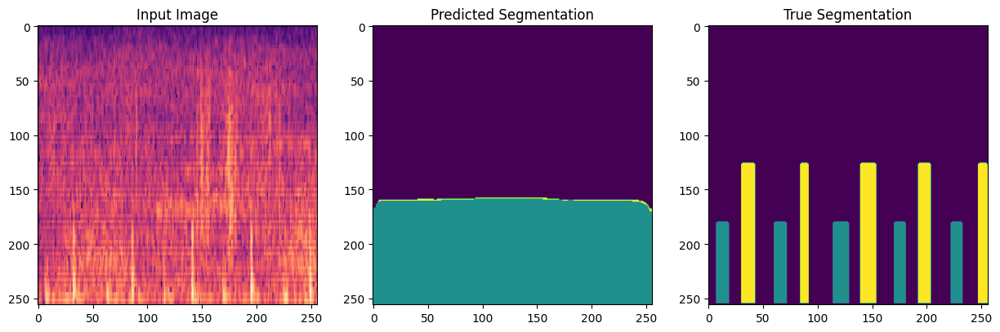

IoU for sample 5: 0.095488063992001


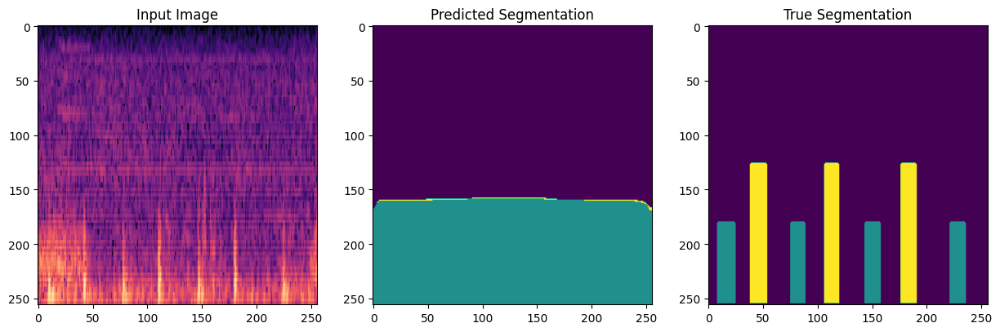

IoU for sample 6: 0.08437447663707921


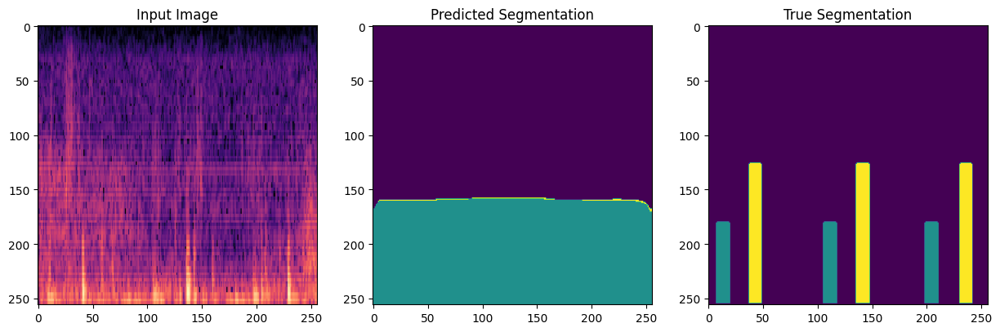

IoU for sample 7: 0.1313923333267208


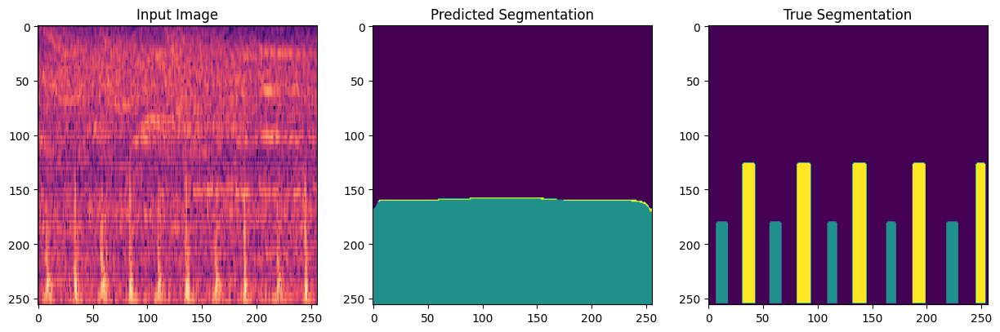

IoU for sample 8: 0.10779379122768624


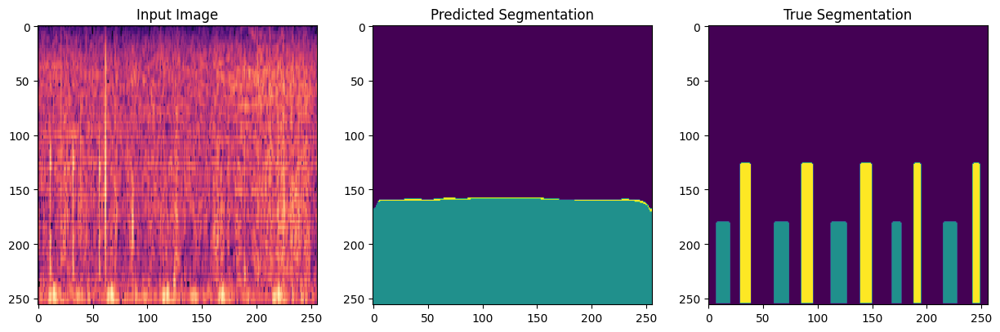

IoU for sample 9: 0.13850760495392403


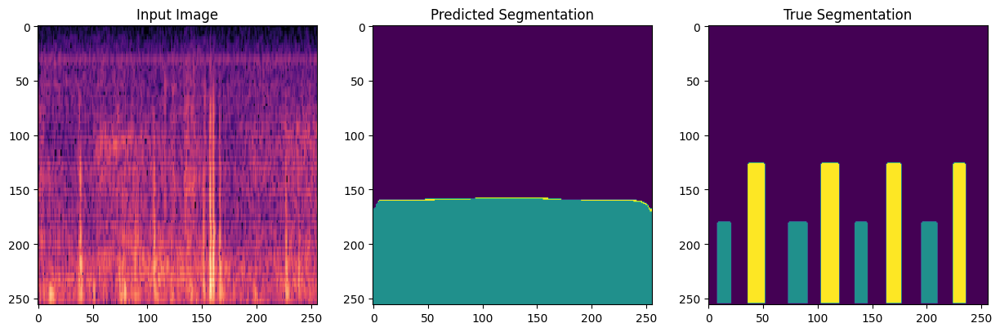

IoU for sample 10: 0.12132364810330912


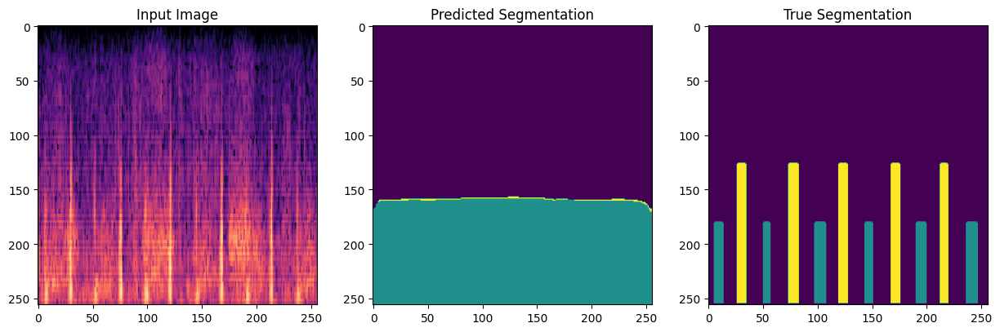

In [ ]:
# IoU 계산 및 출력
iou_values4 = []

for i in range(len(test_input_imgs)):
    # 시각화를 위한 subplot 설정
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(test_input_imgs[i] / 255)
    plt.title("Input Image")

    plt.subplot(1, 3, 2)
    output4 = np.argmax(prediction4[i], axis=-1)
    plt.imshow(output4)
    plt.title("Predicted Segmentation")

    plt.subplot(1, 3, 3)
    plt.imshow(test_targets[i])
    plt.title("True Segmentation")

    # IoU 계산 및 출력
    iou4 = calculate_iou(test_targets[i], output4)
    iou_values4.append(iou4)
    print(f"IoU for sample {i + 1}: {iou4}")

    # 시각화를 위한 subplot 초기화
    plt.show()

In [ ]:
# 전체 평균 IoU 출력
average_iou4 = np.mean(iou_values4)
print(f"\nAverage IoU across all samples: {average_iou4}")


Average IoU across all samples: 0.8616123400512654


**이것 역시, 클래스 별로 IoU 구하는 새로운 IoU 만들어 보자!**

In [ ]:
from tensorflow.keras.models import load_model
import numpy as np
import matplotlib.pyplot as plt

# IoU 계산 함수
def calculate_iou(y_true, y_pred, class_index):
    intersection = np.logical_and(y_true == class_index, y_pred == class_index)
    union = np.logical_or(y_true == class_index, y_pred == class_index)
    iou = np.sum(intersection) / np.sum(union)
    return iou

for i in range(len(test_input_imgs)):
    # 시각화를 위한 subplot 설정
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 4, 1)
    plt.imshow(test_input_imgs[i] / 255)
    plt.title("Input Image")

    for class_index in range(6):  # 클래스 수에 따라 반복
        plt.subplot(2, 6, class_index + 1)
        output4 = np.argmax(prediction4[i], axis=-1)
        plt.imshow(output4 == class_index)
        plt.title(f"Predicted Class {class_index}")

        plt.subplot(2, 6, class_index + 7)
        plt.imshow(test_targets[i]==class_index)
        plt.title(f"Target Class {class_index}")

    # 시각화를 위한 subplot 초기화
    plt.show()

In [ ]:
def calculate_iou_score(target, prediction):
# 각 픽셀별로 어떤 클래스로 예측하고 있는지를 알아야 함
# (128, 128, 6) -> (128, 128, 1)
    one_c_prediction = np.argmax(prediction, axis=2)
    one_c_target = target[:, :, 0]

    # 이미지의 전체 영역 크기 계산
    total_area = one_c_prediction.shape[0] ** 2

    # 각 클래스에 대한 IoU 및 영역 정보를 저장할 리스트 초기화
    IoUs = []
    areas = []

    for class_i in range(6):
        # 해당 클래스에 속하는 픽셀을 True로 설정
        pred = np.where(one_c_prediction==class_i, True, False)
        target = np.where(one_c_target==class_i, True, False)

        intersection = np.logical_and(target, pred) # 교집합
        union = np.logical_or(target, pred) # 합집합
        iou_score = np.sum(intersection) / np.sum(union)

        IoUs.append(iou_score) # IoU 결과 리스트 추가

        # 해당 클래스가 차지하는 영역 구하기
        area = pred.sum() / total_area
        areas.append(area)

    return IoUs, areas

In [ ]:
IoUs4, areas4 = calculate_iou_score(targets[0], prediction4[0])

In [ ]:
sum(IoUs4) / 6

0.46167369231461824

In [ ]:
sum([iou * area for iou, area in zip(IoUs4, areas4)]) # 영역의 크기로 가중치

0.7035248324151393

In [ ]:
import pandas as pd

results_df = pd.DataFrame({
    'Model': ['Unet','Unet++','Segnet','Deeplab'],
    'Accuracy': [test_accuracy, test_accuracy2, test_accuracy3, test_accuracy4],
    'Loss': [test_loss, test_loss2, test_loss3, test_loss4],
    'Average IoU': [average_iou,average_iou2,average_iou3, average_iou4],
    'New IoU' : [sum([iou * area for iou, area in zip(IoUs, areas)]),
                 sum([iou * area for iou, area in zip(IoUs2, areas2)]),
                 sum([iou * area for iou, area in zip(IoUs3, areas3)]),
                 sum([iou * area for iou, area in zip(IoUs4, areas4)])]
})

# 표 출력
print(results_df)


     Model  Accuracy      Loss  Average IoU   New IoU
0     Unet  0.882805  0.735001     0.839562  0.686293
1   Unet++  0.847527  1.378597     0.852989  0.630327
2   Segnet  0.900061  0.461928     0.848391  0.652473
3  Deeplab  0.823360  0.582826     0.861612  0.703525


In [ ]:
for i in range(len(test_input_imgs)):
    # 시각화를 위한 subplot 설정
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 6, 1)
    plt.imshow(test_input_imgs[i] / 255)
    plt.title("Input Image")

    plt.subplot(1, 6, 2)
    output = np.argmax(prediction[i], axis=-1)
    plt.imshow(output)
    plt.title("Unet")

    plt.subplot(1, 6, 3)
    output2 = np.argmax(prediction2[i], axis=-1)
    plt.imshow(output2)
    plt.title("Unet++")

    plt.subplot(1, 6, 4)
    output3 = np.argmax(prediction3[i], axis=-1)
    plt.imshow(output3)
    plt.title("Segnet")

    plt.subplot(1, 6, 5)
    output4 = np.argmax(prediction4[i], axis=-1)
    plt.imshow(output4)
    plt.title("Deeplab")

    plt.subplot(1, 6, 6)
    plt.imshow(test_targets[i])
    plt.title("True Segmentation")

    # 시각화를 위한 subplot 초기화
    plt.show()